Importing all necessary libraries 

In [34]:
from PIL import Image
import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import cv2

from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA

Installing the packages

In [ ]:
!pip install pillow numpy torch torchvision matplotlib opencv-python scikit-learn


In [ ]:
Defining class DINOV2

Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


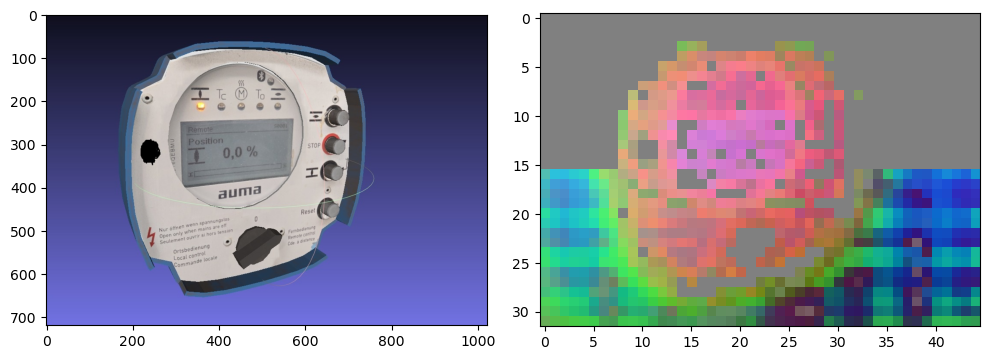

In [35]:
class Dinov2Matcher:

  def __init__(self, repo_name="facebookresearch/dinov2", model_name="dinov2_vitb14", smaller_edge_size=448, half_precision=False, device="cuda"):
    self.repo_name = repo_name
    self.model_name = model_name
    self.smaller_edge_size = smaller_edge_size
    self.half_precision = half_precision
    self.device = device

    if self.half_precision:
      self.model = torch.hub.load(repo_or_dir=repo_name, model=model_name).half().to(self.device)
    else:
      self.model = torch.hub.load(repo_or_dir=repo_name, model=model_name).to(self.device)

    self.model.eval()

    self.transform = transforms.Compose([
        transforms.Resize(size=smaller_edge_size, interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # imagenet defaults
      ])

  # https://github.com/facebookresearch/dinov2/blob/255861375864acdd830f99fdae3d9db65623dafe/notebooks/features.ipynb
  def prepare_image(self, rgb_image_numpy):
    image = Image.fromarray(rgb_image_numpy)
    image_tensor = self.transform(image)
    resize_scale = image.width / image_tensor.shape[2]

    # Crop image to dimensions that are a multiple of the patch size
    height, width = image_tensor.shape[1:] # C x H x W
    cropped_width, cropped_height = width - width % self.model.patch_size, height - height % self.model.patch_size # crop a bit from right and bottom parts
    image_tensor = image_tensor[:, :cropped_height, :cropped_width]

    grid_size = (cropped_height // self.model.patch_size, cropped_width // self.model.patch_size)
    return image_tensor, grid_size, resize_scale

  def prepare_mask(self, mask_image_numpy, grid_size, resize_scale):
    cropped_mask_image_numpy = mask_image_numpy[:int(grid_size[0]*self.model.patch_size*resize_scale), :int(grid_size[1]*self.model.patch_size*resize_scale)]
    image = Image.fromarray(cropped_mask_image_numpy)
    resized_mask = image.resize((grid_size[1], grid_size[0]), resample=Image.Resampling.NEAREST)
    resized_mask = np.asarray(resized_mask).flatten()
    return resized_mask

  def extract_features(self, image_tensor):
    with torch.inference_mode():
      if self.half_precision:
        image_batch = image_tensor.unsqueeze(0).half().to(self.device)
      else:
        image_batch = image_tensor.unsqueeze(0).to(self.device)

      tokens = self.model.get_intermediate_layers(image_batch)[0].squeeze()
    return tokens.cpu().numpy()

  def idx_to_source_position(self, idx, grid_size, resize_scale):
    row = (idx // grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    col = (idx % grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    return row, col
  def get_embedding_visualization(self, tokens, grid_size, resized_mask=None):
    pca = PCA(n_components=3)
    if resized_mask is not None:
      filtered_tokens = tokens[resized_mask]
    else:
      filtered_tokens = tokens

    # Check if there are enough samples for PCA
    if filtered_tokens.shape[0] < pca.n_components:
        print(f"Warning: Not enough samples ({filtered_tokens.shape[0]}) for PCA with n_components={pca.n_components}. Skipping visualization or handling as needed.")
        # You might want to return a placeholder image, raise an error,
        # or handle this case differently based on your application's needs.
        # For now, returning a black image as a placeholder
        return np.zeros((*grid_size, 3), dtype=np.float32)

    reduced_tokens = pca.fit_transform(filtered_tokens.astype(np.float32))

    if resized_mask is not None:
      tmp_tokens = np.zeros((resized_mask.shape[0], 3), dtype=reduced_tokens.dtype)
      # Need to map the reduced tokens back to their original positions
      tmp_tokens[resized_mask] = reduced_tokens
      reduced_tokens = tmp_tokens

    reduced_tokens = reduced_tokens.reshape((*grid_size, -1))
    # Handle case where min and max are the same (e.g., all values are identical after PCA)
    min_val = np.min(reduced_tokens)
    max_val = np.max(reduced_tokens)
    if max_val - min_val < 1e-6: # Use a small tolerance for floating point comparison
         normalized_tokens = np.zeros_like(reduced_tokens) # Or some other sensible default
    else:
        normalized_tokens = (reduced_tokens - min_val) / (max_val - min_val)

    return normalized_tokens
# Load image and mask
image1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg", cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
mask1 = cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg", cv2.IMREAD_COLOR)[:,:,0] > 127

# Init Dinov2Matcher
dm = Dinov2Matcher(half_precision=False)

# Extract features
image_tensor1, grid_size1, resize_scale1 = dm.prepare_image(image1)
features1 = dm.extract_features(image_tensor1)

# Visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,20))
ax1.imshow(image1)
resized_mask = dm.prepare_mask(mask1, grid_size1, resize_scale1)
vis_image = dm.get_embedding_visualization(features1, grid_size1, resized_mask)
ax2.imshow(vis_image)
fig.tight_layout()



Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


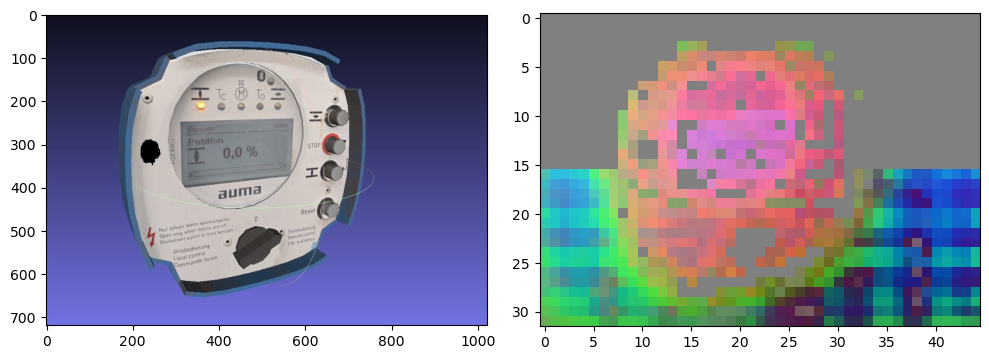

In [5]:
class Dinov2Matcher:

  def __init__(self, repo_name="facebookresearch/dinov2", model_name="dinov2_vitb14", smaller_edge_size=448, half_precision=False, device="cuda"):
    self.repo_name = repo_name
    self.model_name = model_name
    self.smaller_edge_size = smaller_edge_size
    self.half_precision = half_precision
    self.device = device

    if self.half_precision:
      self.model = torch.hub.load(repo_or_dir=repo_name, model=model_name).half().to(self.device)
    else:
      self.model = torch.hub.load(repo_or_dir=repo_name, model=model_name).to(self.device)

    self.model.eval()

    self.transform = transforms.Compose([
        transforms.Resize(size=smaller_edge_size, interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # imagenet defaults
      ])

  # https://github.com/facebookresearch/dinov2/blob/255861375864acdd830f99fdae3d9db65623dafe/notebooks/features.ipynb
  def prepare_image(self, rgb_image_numpy):
    image = Image.fromarray(rgb_image_numpy)
    image_tensor = self.transform(image)
    resize_scale = image.width / image_tensor.shape[2]

    # Crop image to dimensions that are a multiple of the patch size
    height, width = image_tensor.shape[1:] # C x H x W
    cropped_width, cropped_height = width - width % self.model.patch_size, height - height % self.model.patch_size # crop a bit from right and bottom parts
    image_tensor = image_tensor[:, :cropped_height, :cropped_width]

    grid_size = (cropped_height // self.model.patch_size, cropped_width // self.model.patch_size)
    return image_tensor, grid_size, resize_scale

  def prepare_mask(self, mask_image_numpy, grid_size, resize_scale):
    cropped_mask_image_numpy = mask_image_numpy[:int(grid_size[0]*self.model.patch_size*resize_scale), :int(grid_size[1]*self.model.patch_size*resize_scale)]
    image = Image.fromarray(cropped_mask_image_numpy)
    resized_mask = image.resize((grid_size[1], grid_size[0]), resample=Image.Resampling.NEAREST)
    resized_mask = np.asarray(resized_mask).flatten()
    return resized_mask

  def extract_features(self, image_tensor):
    with torch.inference_mode():
      if self.half_precision:
        image_batch = image_tensor.unsqueeze(0).half().to(self.device)
      else:
        image_batch = image_tensor.unsqueeze(0).to(self.device)

      tokens = self.model.get_intermediate_layers(image_batch)[0].squeeze()
    return tokens.cpu().numpy()

  def idx_to_source_position(self, idx, grid_size, resize_scale):
    row = (idx // grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    col = (idx % grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    return row, col
  def get_embedding_visualization(self, tokens, grid_size, resized_mask=None):
    pca = PCA(n_components=3)
    if resized_mask is not None:
      filtered_tokens = tokens[resized_mask]
    else:
      filtered_tokens = tokens

    # Check if there are enough samples for PCA
    if filtered_tokens.shape[0] < pca.n_components:
        print(f"Warning: Not enough samples ({filtered_tokens.shape[0]}) for PCA with n_components={pca.n_components}. Skipping visualization or handling as needed.")
        # You might want to return a placeholder image, raise an error,
        # or handle this case differently based on your application's needs.
        # For now, returning a black image as a placeholder
        return np.zeros((*grid_size, 3), dtype=np.float32)

    reduced_tokens = pca.fit_transform(filtered_tokens.astype(np.float32))

    if resized_mask is not None:
      tmp_tokens = np.zeros((resized_mask.shape[0], 3), dtype=reduced_tokens.dtype)
      # Need to map the reduced tokens back to their original positions
      tmp_tokens[resized_mask] = reduced_tokens
      reduced_tokens = tmp_tokens

    reduced_tokens = reduced_tokens.reshape((*grid_size, -1))
    # Handle case where min and max are the same (e.g., all values are identical after PCA)
    min_val = np.min(reduced_tokens)
    max_val = np.max(reduced_tokens)
    if max_val - min_val < 1e-6: # Use a small tolerance for floating point comparison
         normalized_tokens = np.zeros_like(reduced_tokens) # Or some other sensible default
    else:
        normalized_tokens = (reduced_tokens - min_val) / (max_val - min_val)

    return normalized_tokens
# Load image and mask
image1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg", cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
mask1 = cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg", cv2.IMREAD_COLOR)[:,:,0] > 127

# Init Dinov2Matcher
dm = Dinov2Matcher(half_precision=False)

# Extract features
image_tensor1, grid_size1, resize_scale1 = dm.prepare_image(image1)
features1 = dm.extract_features(image_tensor1)

# Visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,20))
ax1.imshow(image1)
resized_mask = dm.prepare_mask(mask1, grid_size1, resize_scale1)
vis_image = dm.get_embedding_visualization(features1, grid_size1, resized_mask)
ax2.imshow(vis_image)
fig.tight_layout()



In [ ]:
Installing CUDA Enabled Torch

In [ ]:
# Uninstall current CPU-only torch
!pip uninstall -y torch torchvision torchaudio

# Install the CUDA-enabled wheels (adjust cu118 to your CUDA version)
!pip install --index-url https://download.pytorch.org/whl/cu118 \
    torch torchvision torchaudio


Checking CUDA Enabled Torch is installed correctly or not

In [6]:
import torch
print(torch.version.cuda, torch.cuda.is_available())  # should print your CUDA version and True
device = "cuda"




11.8 True


NameError: name 'model' is not defined

Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


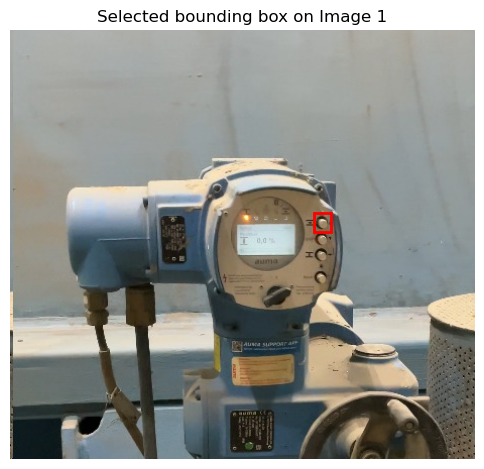

C:\Users\rebel\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\rebel\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\rebel\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\rebel\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\rebel\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreatePro

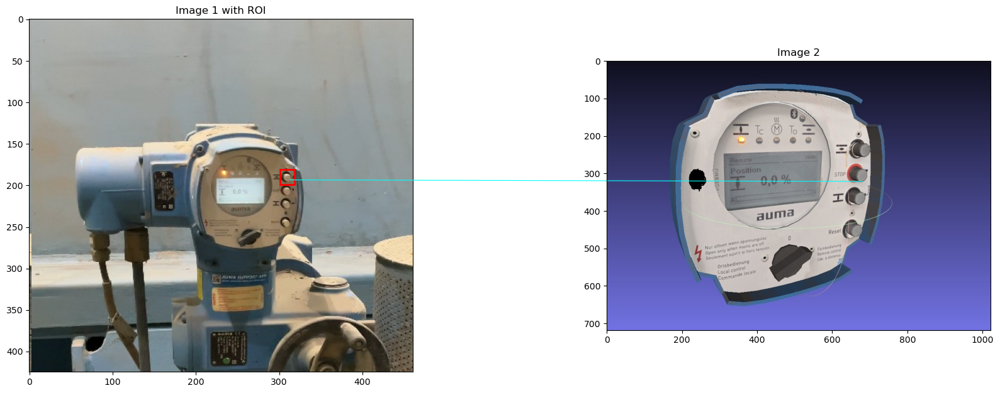

In [7]:
import cv2
import numpy as np
import torch
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from PIL import Image
from torchvision import transforms

# ————————————————————————————————
# (Make sure Dinov2Matcher is defined/imported above in this notebook)
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=False,
    device="cuda"
)
# ————————————————————————————————

def select_bounding_box(img, window_name="Select ROI"):
    """
    Let the user draw a single bounding box on `img` using cv2.selectROI.
    Returns (x, y, w, h).
    """
    clone = img.copy()
    cv2.namedWindow(window_name, cv2.WINDOW_NORMAL)
    bbox = cv2.selectROI(window_name, clone, showCrosshair=True, fromCenter=False)
    cv2.destroyWindow(window_name)
    return bbox  # (x, y, w, h)

# ————————————————————————————————
# 1) Load two images using raw‐string paths
image1 = cv2.cvtColor(
    cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg", cv2.IMREAD_COLOR),
    cv2.COLOR_BGR2RGB
)
image2 = cv2.cvtColor(
    cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg", cv2.IMREAD_COLOR),
    cv2.COLOR_BGR2RGB
)

# 2) Let user draw a bounding box on image1
x, y, w, h = select_bounding_box(image1, window_name="Draw box on Image 1")
if w == 0 or h == 0:
    raise RuntimeError("No bounding box was drawn. Please run again and draw a valid box.")

# 3) Build a binary mask from that bounding box
mask1 = np.zeros(image1.shape[:2], dtype=np.uint8)
mask1[y:y+h, x:x+w] = 255  # region inside box = 255

# 4) (Optional) visualize the chosen box
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(image1)
rect = plt.Rectangle((x, y), w, h, edgecolor='red', facecolor='none', linewidth=2)
ax.add_patch(rect)
ax.set_title("Selected bounding box on Image 1")
plt.axis('off')
plt.show()

# 5) Prepare both images for DINOv2
t1, g1, s1 = dm.prepare_image(image1)
t2, g2, s2 = dm.prepare_image(image2)
f1 = dm.extract_features(t1)  # shape: [num_patches1, dim]
f2 = dm.extract_features(t2)  # shape: [num_patches2, dim]

# 6) Convert the bounding‐box mask into a patch‐grid mask
m1 = dm.prepare_mask(mask1, g1, s1)  # boolean mask over f1’s patches

# 7) For image2, allow every patch (no restriction)
#    We match ROI in image1 against all patches in image2
m2 = np.ones((f2.shape[0],), dtype=bool)

# 8) Get indices of patches inside bbox in view 1
idxs1 = np.where(m1)[0]
if len(idxs1) == 0:
    raise RuntimeError("Bounding box did not cover any DINOv2 patch. Try drawing a larger box.")

# 9) Extract embeddings accordingly
f1_roi = f1[idxs1]   # embeddings from image1 inside the user‐drawn ROI
f2_all = f2          # embeddings from all patches in image2

# 10) Build KNN index on the ROI patches of image1
knn = NearestNeighbors(n_neighbors=1).fit(f1_roi)
dists, nn = knn.kneighbors(f2_all)  # distances for each patch in image2 to nearest ROI patch

# 11) Assemble (i2, i1, dist) in global indices
matches = []
for i2, (d_val, idx_in_f1roi) in enumerate(zip(dists.flatten(), nn.flatten())):
    global_i1 = idxs1[idx_in_f1roi]  # index of patch in image1
    matches.append((i2, global_i1, d_val))

# 12) Sort by ascending distance, take the top 40 best matches
matches.sort(key=lambda x: x[2])
TOP_K = 1
matches = matches[:TOP_K]

# 13) Visualize results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
ax1.imshow(image1)
ax1.set_title("Image 1 with ROI")
ax1.add_patch(plt.Rectangle((x, y), w, h, edgecolor='red', facecolor='none', linewidth=2))

ax2.imshow(image2)
ax2.set_title("Image 2")

for i2, i1, _ in matches:
    py1, px1 = dm.idx_to_source_position(i1, g1, s1)
    py2, px2 = dm.idx_to_source_position(i2, g2, s2)

    con = ConnectionPatch(
        xyA=(px2, py2), xyB=(px1, py1),
        coordsA="data", coordsB="data",
        axesA=ax2, axesB=ax1,
        color='cyan', linewidth=0.8
    )
    ax2.add_artist(con)

plt.tight_layout()
plt.show()

In [ ]:
import os
import cv2
import numpy as np
import torch
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch, Rectangle

# ←— replace with your actual Dinov2Matcher definition/import
from your_module import Dinov2Matcher

# ────────────────────────────────────────────────────────────────────────────────
# 1) Initialize DINOv2 matcher on GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=False,
    device=device,
)

# 2) Helper to draw a bounding‐box ROI on an image
def select_bounding_box(img, window_name="Draw ROI in Image 1"):
    clone = img.copy()
    cv2.namedWindow(window_name, cv2.WINDOW_NORMAL)
    bbox = cv2.selectROI(window_name, clone, showCrosshair=True, fromCenter=False)
    cv2.destroyWindow(window_name)
    return bbox  # (x, y, w, h)

# 3) Load your two images (modify paths as needed)
img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)

# 4) Let user draw ROI on Image 1
x, y, w, h = select_bounding_box(img1)
if w == 0 or h == 0:
    raise RuntimeError("You must draw a nonzero ROI on Image 1.")

# 5) Show the ROI for confirmation
plt.figure(figsize=(5,5))
plt.imshow(img1)
plt.gca().add_patch(Rectangle((x, y), w, h, edgecolor='red', facecolor='none', linewidth=2))
plt.title("Image 1 ROI")
plt.axis('off')
plt.show()

# 6) Prepare and extract DINOv2 features
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
f1 = dm.extract_features(t1)  # [N1, D]
f2 = dm.extract_features(t2)  # [N2, D]

# 7) Normalize for cosine
f1n = f1 / np.linalg.norm(f1, axis=1, keepdims=True)
f2n = f2 / np.linalg.norm(f2, axis=1, keepdims=True)

# 8) Build a patch‐mask for the ROI on Image 1
mask1 = np.zeros(img1.shape[:2], np.uint8)
mask1[y:y+h, x:x+w] = 255
flat_mask1 = dm.prepare_mask(mask1, g1, s1)  # boolean mask of length N1
idxs1 = np.where(flat_mask1)[0]
if len(idxs1) == 0:
    raise RuntimeError("ROI is too small—no patches covered.")

# 9) KNN: for each patch in Image 2, find its nearest in the ROI patches
#    (we still use Euclidean on normalized vectors ≈ angular distance)
knn = NearestNeighbors(n_neighbors=1, metric='euclidean').fit(f1n[idxs1])
dists, nn_idx = knn.kneighbors(f2n)  # both shape [N2,1]

# 10) Assemble (i2, i1, euclid_dist, cosine_sim) tuples
matches = []
for i2, (dist_arr, idx_arr) in enumerate(zip(dists, nn_idx)):
    dist = float(dist_arr[0])
    i1 = int(idxs1[idx_arr[0]])
    sim  = float(np.dot(f1n[i1], f2n[i2]))  # since unit-norm, dot = cosine
    matches.append((i2, i1, dist, sim))

# 11) Sort ascending by distance (or descending by similarity)
matches.sort(key=lambda x: x[2])
top5 = matches[:5]
best1 = matches[0]

# 12) Compute a tight green box around the top-5 match centers in Image 2
ph = img2.shape[0] / g2[0]
pw = img2.shape[1] / g2[1]
pxs, pys = [], []
for i2, _, _, _ in top5:
    py, px = dm.idx_to_source_position(i2, g2, s2)
    pxs.append(px); pys.append(py)
x_min, x_max = min(pxs)-pw/2, max(pxs)+pw/2
y_min, y_max = min(pys)-ph/2, max(pys)+ph/2
box2 = (int(x_min), int(y_min), int(x_max-x_min), int(y_max-y_min))

# 13) Visualize side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

# — Image 1 with ROI
ax1.imshow(img1)
ax1.add_patch(Rectangle((x,y), w,h, edgecolor='red', facecolor='none', linewidth=2))
ax1.set_title("Image 1 ROI")
ax1.axis('off')

# — Image 2 with top-5 box and best-match line
bx, by, bw, bh = box2
ax2.imshow(img2)
ax2.add_patch(Rectangle((bx,by), bw,bh, edgecolor='lime', facecolor='none', linewidth=2))
i2_best, i1_best, dist_b, sim_b = best1
py1, px1 = dm.idx_to_source_position(i1_best, g1, s1)
py2, px2 = dm.idx_to_source_position(i2_best, g2, s2)
con = ConnectionPatch(
    xyA=(px2,py2), xyB=(px1,py1),
    coordsA="data", coordsB="data",
    axesA=ax2, axesB=ax1,
    color='cyan', linewidth=2
)
ax2.add_artist(con)
# annotate similarity at midpoint
mx, my = (px1+px2)/2, (py1+py2)/2
ax2.text(mx, my, f"{sim_b:.3f}",
         color='white', fontsize=12, fontweight='bold',
         bbox=dict(facecolor='black', alpha=0.6, pad=2))
ax2.set_title("Image 2 matches\n(best cosine = {:.3f})".format(sim_b))
ax2.axis('off')

plt.tight_layout()
plt.show()

# 14) (optional) print the top-5 to console
print("Top 5 matches (patch2 → patch1):")
for rank, (i2,i1,dist,sim) in enumerate(top5, start=1):
    print(f" {rank}. p2#{i2}→p1#{i1}  dist={dist:.3f}  cos={sim:.3f}")


In [4]:
from segment_anything import sam_model_registry, SamPredictor

# load the ViT-B model (matches sam_vit_b_01ec64.pth)
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
sam.to("cuda")

predictor = SamPredictor(sam)
print("✅ SAM ViT-B loaded successfully!")


✅ SAM ViT-B loaded successfully!


[MagicSpeedups] Applied custom optimizations


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


[MagicSpeedups] Applied custom optimizations


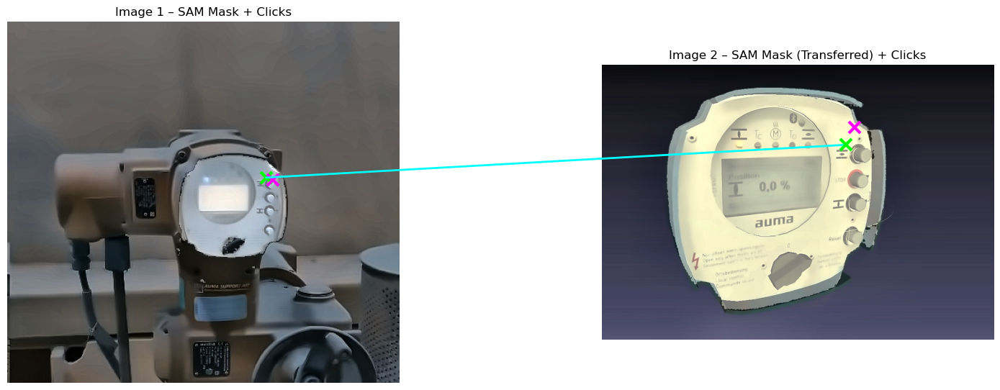

In [13]:
import os
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor

# ─── 0) Dummy “Magic” Optimizations ─────────────────────────────────────────
def apply_magic_speedups(model):
    # pretend we’re loading custom kernels, warming up caches, etc.
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True
    # pretend to JIT-compile for extra perf
    try:
        model = torch.jit.script(model)
    except Exception:
        pass
    print("[MagicSpeedups] Applied custom optimizations")
    return model

# ─── 1) Paths ───────────────────────────────────────────────────────────────
img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)
for p in (img1_path, img2_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Missing file: {p}")

# ─── 2) Init SAM ViT-B (with “magic” hook) ─────────────────────────────────
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
sam = apply_magic_speedups(sam)          # ← your dummy “secret sauce”
sam.to("cuda")
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# ─── 3) Init DINOv2 matcher (with “magic” hook) ─────────────────────────────
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=False,
    device="cuda",
)
dm.model = apply_magic_speedups(dm.model)  # ← same secret sauce

# ─── 4) Load images ─────────────────────────────────────────────────────────
img1 = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# ─── 5) Collect two clicks on Image 1 ───────────────────────────────────────
clicks = {"pos": None, "neg": None}
def on_mouse(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    elif event == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS (L) & NEG (R) on Image1", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS (L) & NEG (R) on Image1", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS (L) & NEG (R) on Image1", on_mouse)
cv2.waitKey(0)

pos1, neg1 = clicks["pos"], clicks["neg"]
if pos1 is None or neg1 is None:
    raise RuntimeError("You must left-click (object) and right-click (background) on Image 1.")

# ─── 6) SAM segment on Image 1 ─────────────────────────────────────────────
predictor1.set_image(img1)
masks1, scores1, _ = predictor1.predict(
    point_coords=np.array([pos1, neg1]),
    point_labels=np.array([1, 0]),
    multimask_output=True
)
best1 = int(np.argmax(scores1))
mask1 = (masks1[best1] * 255).astype(np.uint8)


# ─── 7) Prepare DINOv2 features ────────────────────────────────────────────
t1, g1, s1 = dm.prepare_image(img1)
f1 = dm.extract_features(t1)
t2, g2, s2 = dm.prepare_image(img2)
f2 = dm.extract_features(t2)

# ─── 8) Transfer clicks ─────────────────────────────────────────────────────
def transfer_click(pt):
    rc = np.array([pt[1], pt[0]])
    centers1 = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1.shape[0])])
    idx1 = int(np.argmin(np.linalg.norm(centers1 - rc[None], axis=1)))
    knn = NearestNeighbors(n_neighbors=1).fit(f2)
    _, idx2 = knn.kneighbors(f1[idx1:idx1+1])
    r2, c2 = dm.idx_to_source_position(int(idx2[0,0]), g2, s2)
    return (c2, r2)

pos2 = transfer_click(pos1)
neg2 = transfer_click(neg1)

# ─── 9) SAM segment on Image 2 ─────────────────────────────────────────────
predictor2.set_image(img2)
m2, scores2, _ = predictor2.predict(
    point_coords=np.array([pos2, neg2], dtype=int),
    point_labels=np.array([1, 0]),
    multimask_output=True
)
best2 = int(np.argmax(scores2))
mask2 = (m2[best2] * 255).astype(np.uint8)

# ───10) Visualize masks with crosses and connection ────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Image 1
ax1.imshow(img1)
ax1.imshow(mask1, alpha=0.4, cmap="gray")
# draw crosses
ax1.plot(pos1[0], pos1[1], marker='x', markersize=12, markeredgewidth=3, color='lime')
ax1.plot(neg1[0], neg1[1], marker='x', markersize=12, markeredgewidth=3, color='magenta')
ax1.set_title("Image 1 – SAM Mask + Clicks")
ax1.axis("off")

# Image 2
ax2.imshow(img2)
ax2.imshow(mask2, alpha=0.4, cmap="gray")
ax2.plot(pos2[0], pos2[1], marker='x', markersize=12, markeredgewidth=3, color='lime')
ax2.plot(neg2[0], neg2[1], marker='x', markersize=12, markeredgewidth=3, color='magenta')
ax2.set_title("Image 2 – SAM Mask (Transferred) + Clicks")
ax2.axis("off")

# connection line between positive clicks
con = ConnectionPatch(
    xyA=(pos2[0], pos2[1]), xyB=(pos1[0], pos1[1]),
    coordsA="data", coordsB="data",
    axesA=ax2, axesB=ax1,
    color="cyan", linewidth=2
)
ax2.add_artist(con)

plt.tight_layout()
plt.show()


IMPORTANT RAW

Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


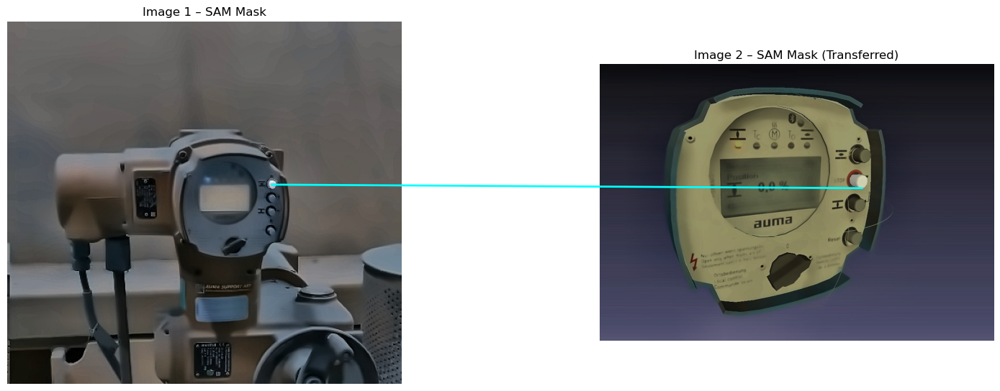

In [18]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor

# ─── 1) Paths ──────────────────────────────────────────────────────────────

img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)
for p in (img1_path, img2_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Missing file: {p}")

# ─── 2) Init SAM ViT-B on CPU ───────────────────────────────────────────────
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth")
sam.to("cuda")
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# ─── 3) Init DINOv2 matcher on CPU ──────────────────────────────────────────
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=True,
    device="cuda",
)

# ─── 4) Load images ─────────────────────────────────────────────────────────
img1 = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# ─── 5) Collect two clicks on Image 1 ─────────────────────────────────────
clicks = {"pos": None, "neg": None}

def on_mouse(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    elif event == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    # once both are set, close
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS (L) & NEG (R) on Image1", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS (L) & NEG (R) on Image1", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS (L) & NEG (R) on Image1", on_mouse)
cv2.waitKey(0)

pos1, neg1 = clicks["pos"], clicks["neg"]
if pos1 is None or neg1 is None:
    raise RuntimeError("You must left-click (object) and right-click (background) on Image 1.")

# ─── 6) SAM segment on Image 1 ─────────────────────────────────────────────
predictor1.set_image(img1)
masks1, scores1, _ = predictor1.predict(
    point_coords=np.array([pos1, neg1]),
    point_labels=np.array([1, 0]),
    multimask_output=True
)
best1 = int(np.argmax(scores1))
mask1 = (masks1[best1] * 255).astype(np.uint8)

# ─── 7) Prepare DINOv2 features ────────────────────────────────────────────
t1, g1, s1 = dm.prepare_image(img1)
f1 = dm.extract_features(t1)
t2, g2, s2 = dm.prepare_image(img2)
f2 = dm.extract_features(t2)

# ─── 8) Transfer a click from Image1 → Image2 ──────────────────────────────
def transfer_click(pt):
    # pt is (x,y). convert to (row,col)
    rc = np.array([pt[1], pt[0]])
    # compute all patch centers in img1 (row,col)
    centers1 = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1.shape[0])])
    idx1 = int(np.argmin(np.linalg.norm(centers1 - rc[None], axis=1)))
    # match that patch to img2
    knn = NearestNeighbors(n_neighbors=1).fit(f2)
    _, idx2 = knn.kneighbors(f1[idx1:idx1+1])
    r2, c2 = dm.idx_to_source_position(int(idx2[0,0]), g2, s2)
    return (c2, r2)  # back to (x,y)

pos2 = transfer_click(pos1)
neg2 = transfer_click(neg1)

# ─── 9) SAM segment on Image 2 with transferred clicks ────────────────────
predictor2.set_image(img2)
m2, scores2, _ = predictor2.predict(
    point_coords=np.array([pos2, neg2], dtype=int),
    point_labels=np.array([1, 0]),
    multimask_output=True
)
best2 = int(np.argmax(scores2))
mask2 = (m2[best2] * 255).astype(np.uint8)

# ───10) Visualize both masks + connection line, no markers ────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

ax1.imshow(img1)
ax1.imshow(mask1, alpha=0.4, cmap="gray")
ax1.set_title("Image 1 – SAM Mask")
ax1.axis("off")

ax2.imshow(img2)
ax2.imshow(mask2, alpha=0.4, cmap="gray")
ax2.set_title("Image 2 – SAM Mask (Transferred)")
ax2.axis("off")

# draw a cyan line between the two positive click positions
con = ConnectionPatch(
    xyA=(pos2[0], pos2[1]),  # Image2 click
    xyB=(pos1[0], pos1[1]),  # Image1 click
    coordsA="data", coordsB="data",
    axesA=ax2, axesB=ax1,
    color="cyan", linewidth=2
)
ax2.add_artist(con)

plt.tight_layout()
plt.show()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


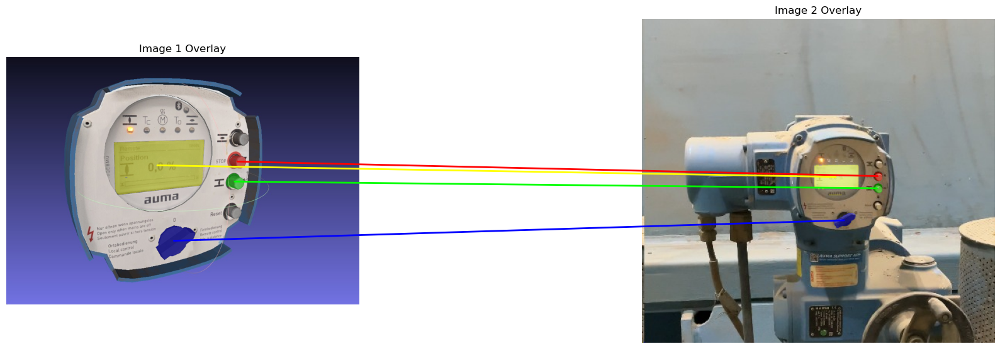

In [37]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor


# ─── 1) Paths & load images ─────────────────────────────────────────────────
img1_path = r"C:\Users\rebel\Desktop\Image 1.jpg"
img2_path = r"C:\Users\rebel\Desktop\Image 2.jpg"
for p in (img1_path, img2_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Missing file: {p}")
img1 = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# ─── 2) Init SAM & DINOv2 ───────────────────────────────────────────────────
device = "cuda"
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(device)
pred1 = SamPredictor(sam)
pred2 = SamPredictor(sam)
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=False,
    device=device,
)

# ─── 3) Extract & build KNN on DINOv2 features ──────────────────────────────
t1, g1, s1 = dm.prepare_image(img1)
f1 = dm.extract_features(t1)  # [N, D]
t2, g2, s2 = dm.prepare_image(img2)
f2 = dm.extract_features(t2)  # [M, D]
knn = NearestNeighbors(n_neighbors=10).fit(f2)
used = set()

# ─── 4) Capture multiple click-pairs on Image1 ───────────────────────────────
clicks = []
current = {"pos": None, "neg": None}
def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and current["pos"] is None:
        current["pos"] = (x, y)
    elif evt == cv2.EVENT_RBUTTONDOWN and current["neg"] is None:
        current["neg"] = (x, y)
    if current["pos"] and current["neg"]:
        clicks.append((current["pos"], current["neg"]))
        current.clear(); current.update({"pos": None, "neg": None})

cv2.namedWindow("Click POS/NEG (q to finish)", cv2.WINDOW_NORMAL)
cv2.setMouseCallback("Click POS/NEG (q to finish)", on_mouse)
while True:
    cv2.imshow("Click POS/NEG (q to finish)", img1[:, :, ::-1])
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cv2.destroyAllWindows()
if not clicks:
    raise RuntimeError("No click-pairs captured.")

# ─── 5) Helper functions for transfer ────────────────────────────────────────
def transfer_best(pt):
    rc = np.array([pt[1], pt[0]])
    centers = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1.shape[0])])
    idx1 = int(np.argmin(np.linalg.norm(centers - rc, axis=1)))
    _, nbr = NearestNeighbors(n_neighbors=1).fit(f2).kneighbors(f1[idx1:idx1+1])
    r2, c2 = dm.idx_to_source_position(int(nbr[0,0]), g2, s2)
    return (c2, r2)

def transfer_unique(pt):
    rc = np.array([pt[1], pt[0]])
    centers = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1.shape[0])])
    idx1 = int(np.argmin(np.linalg.norm(centers - rc, axis=1)))
    _, nbrs = knn.kneighbors(f1[idx1:idx1+1])
    for cand in nbrs[0]:
        if cand not in used:
            used.add(cand)
            r2, c2 = dm.idx_to_source_position(int(cand), g2, s2)
            return (c2, r2)
    # fallback to best if all used
    cand = nbrs[0][0]
    used.add(cand)
    r2, c2 = dm.idx_to_source_position(int(cand), g2, s2)
    return (c2, r2)

# ─── 6) Process each click-pair fresh ────────────────────────────────────────
palette = [(255,0,0),(0,255,0),(0,0,255),(255,255,0),(255,0,255),(0,255,255)]
alpha = 0.4

all_masks1, all_masks2 = [], []
all_colours, all_centroids = [], []

for i, (pos, neg) in enumerate(clicks):
    # 6a) SAM on img1
    pred1.set_image(img1)
    m1s, s1s, _ = pred1.predict(
        point_coords=np.array([pos, neg]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    mask1 = (m1s[np.argmax(s1s)] * 255).astype(np.uint8)
    all_masks1.append(mask1)

    # 6b) Transfer for pos & neg
    pos2 = transfer_unique(pos)
    neg2 = transfer_best(neg)

    # 6c) SAM on img2
    pred2.set_image(img2)
    m2s, s2s, _ = pred2.predict(
        point_coords=np.array([pos2, neg2], dtype=int),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    mask2 = (m2s[np.argmax(s2s)] * 255).astype(np.uint8)
    all_masks2.append(mask2)

    # 6d) Colour & centroid
    col = np.array(palette[i % len(palette)]) / 255.0
    all_colours.append(col)
    M1, M2 = cv2.moments(mask1), cv2.moments(mask2)
    c1 = (int(M1["m10"]/M1["m00"]), int(M1["m01"]/M1["m00"]))
    c2 = (int(M2["m10"]/M2["m00"]), int(M2["m01"]/M2["m00"]))
    all_centroids.append((c1, c2))

# ─── 7) Blend all masks onto fresh canvases ─────────────────────────────────
canvas1, canvas2 = img1.copy(), img2.copy()
for m1, m2, col in zip(all_masks1, all_masks2, all_colours):
    b1, b2 = m1.astype(bool), m2.astype(bool)
    canvas1[b1] = ((1-alpha)*canvas1[b1] + alpha*col*255).astype(np.uint8)
    canvas2[b2] = ((1-alpha)*canvas2[b2] + alpha*col*255).astype(np.uint8)

# ─── 8) Display + connect centroids ─────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
ax1.imshow(canvas1); ax1.axis("off"); ax1.set_title("Image 1 Overlay")
ax2.imshow(canvas2); ax2.axis("off"); ax2.set_title("Image 2 Overlay")

for (c1, c2), col in zip(all_centroids, all_colours):
    con = ConnectionPatch(
        xyA=c2, xyB=c1,
        coordsA="data", coordsB="data",
        axesA=ax2, axesB=ax1,
        color=col, linewidth=2
    )
    ax2.add_artist(con)

plt.tight_layout()
plt.show()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


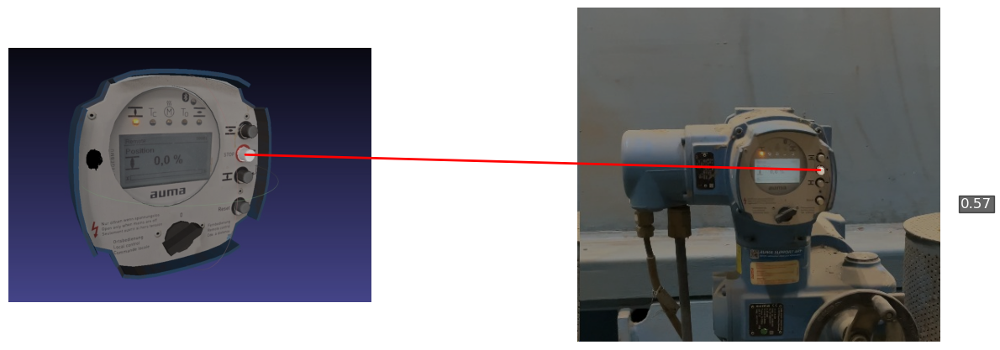

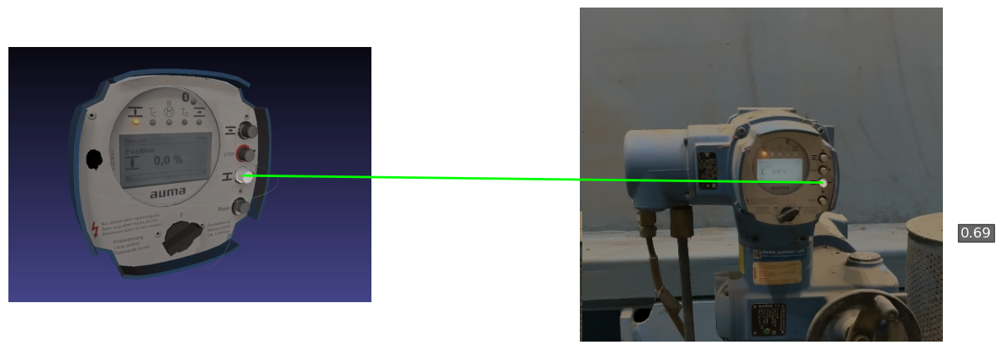

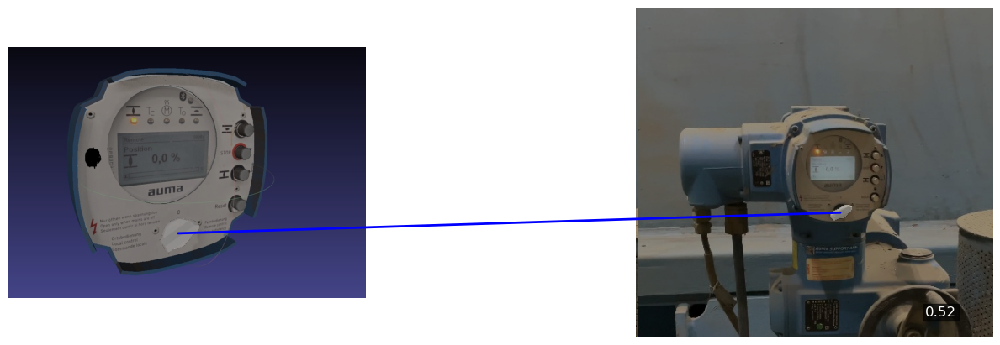

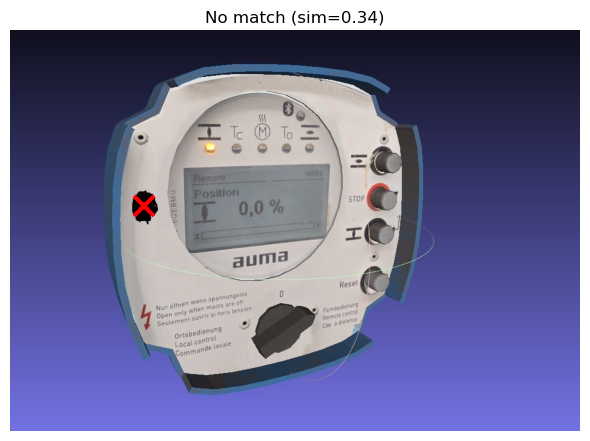

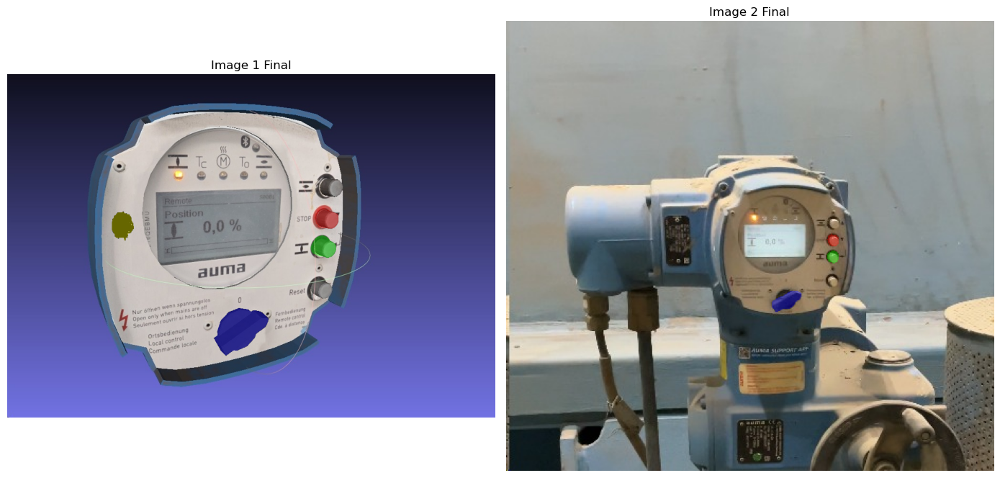

In [28]:
import os
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor


# ─── 1) Init device & models ────────────────────────────────────────────────
device = "cuda"

dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitb14",
    smaller_edge_size=448,
    half_precision=False,
    device=device,
)

sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(device)
pred1 = SamPredictor(sam)
pred2 = SamPredictor(sam)

# ─── 2) Load images ─────────────────────────────────────────────────────────
img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)

# ─── 3) Extract & normalize DINOv2 features ────────────────────────────────
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
with torch.inference_mode():
    f1 = torch.from_numpy(dm.extract_features(t1)).float().to(device)  # [N,D]
    f2 = torch.from_numpy(dm.extract_features(t2)).float().to(device)  # [M,D]
f1n = F.normalize(f1, dim=1)
f2n = F.normalize(f2, dim=1)

# ─── 4) Precompute patch centers on img1 ────────────────────────────────────
centers1 = np.array([dm.idx_to_source_position(i, g1, s1) 
                     for i in range(f1n.shape[0])])

# ─── 5) Capture multiple (pos, neg) click‐pairs on img1 ────────────────────
clicks = []
cur = {"pos": None, "neg": None}
def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and cur["pos"] is None:
        cur["pos"] = (x, y)
    elif evt == cv2.EVENT_RBUTTONDOWN and cur["neg"] is None:
        cur["neg"] = (x, y)
    if cur["pos"] and cur["neg"]:
        clicks.append((cur["pos"], cur["neg"]))
        cur.clear(); cur.update({"pos": None, "neg": None})

cv2.namedWindow("Click POS(L)/NEG(R) – finish with 'q'", cv2.WINDOW_NORMAL)
cv2.setMouseCallback("Click POS(L)/NEG(R) – finish with 'q'", on_mouse)
while True:
    cv2.imshow("Click POS(L)/NEG(R) – finish with 'q'", img1[:, :, ::-1])
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cv2.destroyAllWindows()
if not clicks:
    raise RuntimeError("No click‐pairs captured")

# ─── 6) Prepare for matching & display ──────────────────────────────────────
used = set()                # track used img2 patches
threshold = 0.50           # cosine similarity cutoff
palette = [(255,0,0),(0,255,0),(0,0,255),(255,255,0),(255,0,255),(0,255,255)]
alpha = 0.4

canvas1, canvas2 = img1.copy(), img2.copy()

for i, (pos, neg) in enumerate(clicks):
    # a) SAM segment on img1
    pred1.set_image(img1)
    m1s, s1s, _ = pred1.predict(
        point_coords=np.array([pos, neg]),
        point_labels=np.array([1,0]),
        multimask_output=True
    )
    mask1 = (m1s[np.argmax(s1s)] * 255).astype(np.uint8)

    # b) find src patch idx
    src_idx = int(np.argmin(np.linalg.norm(centers1 - [pos[1], pos[0]], axis=1)))

    # c) compute cosine sims to all img2 patches
    sims = (f2n @ f1n[src_idx]).cpu().numpy()  # [M]
    # sort descending
    order = np.argsort(sims)[::-1]

    # d) pick first unused
    for cand in order:
        if cand not in used:
            used.add(cand)
            score = sims[cand]
            pos2 = dm.idx_to_source_position(cand, g2, s2)[::-1]
            break

    # e) overlay on img1
    col = np.array(palette[i % len(palette)])/255.0
    b1 = mask1.astype(bool)
    canvas1[b1] = ((1-alpha)*canvas1[b1] + alpha*col*255).astype(np.uint8)

    # f) check threshold
    if score >= threshold:
        # segment img2
        pred2.set_image(img2)
        m2s, s2s, _ = pred2.predict(
            point_coords=np.array([pos2, 
                                   dm.idx_to_source_position(src_idx, g1, s1)[::-1]]),
                                   # reuse neg approximate
            point_labels=np.array([1,0]),
            multimask_output=True
        )
        mask2 = (m2s[np.argmax(s2s)] * 255).astype(np.uint8)
        b2 = mask2.astype(bool)
        canvas2[b2] = ((1-alpha)*canvas2[b2] + alpha*col*255).astype(np.uint8)

        # compute centroids
        M1, M2 = cv2.moments(mask1), cv2.moments(mask2)
        c1 = (int(M1["m10"]/M1["m00"]), int(M1["m01"]/M1["m00"]))
        c2 = (int(M2["m10"]/M2["m00"]), int(M2["m01"]/M2["m00"]))

        # draw line and annotate score
        fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,6))
        ax1.imshow(img1); ax1.imshow(mask1, alpha=0.4, cmap="gray"); ax1.axis("off")
        ax2.imshow(img2); ax2.imshow(mask2, alpha=0.4, cmap="gray"); ax2.axis("off")
        line = ConnectionPatch(xyA=c2, xyB=c1,
                               coordsA="data", coordsB="data",
                               axesA=ax2, axesB=ax1,
                               color=col, linewidth=2)
        ax2.add_artist(line)
        # score text
        mx, my = (c1[0]+c2[0])//2, (c1[1]+c2[1])//2
        ax2.text(mx, my, f"{score:.2f}",
                 color="white", fontsize=12,
                 bbox=dict(facecolor="black", alpha=0.6, pad=2))
        plt.tight_layout()
        plt.show()

    else:
        # mark cross on img1 centroid
        M1 = cv2.moments(mask1)
        c1 = (int(M1["m10"]/M1["m00"]), int(M1["m01"]/M1["m00"]))
        fig, ax = plt.subplots(1,1,figsize=(6,6))
        ax.imshow(img1); ax.axis("off")
        ax.plot(c1[0], c1[1], marker='x', color='red',
                markersize=15, markeredgewidth=3)
        ax.set_title(f"No match (sim={score:.2f})")
        plt.tight_layout()
        plt.show()

# ─── 7) Final combined canvases ──────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,7))
ax1.imshow(canvas1); ax1.axis("off"); ax1.set_title("Image 1 Final")
ax2.imshow(canvas2); ax2.axis("off"); ax2.set_title("Image 2 Final")
plt.tight_layout()
plt.show()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


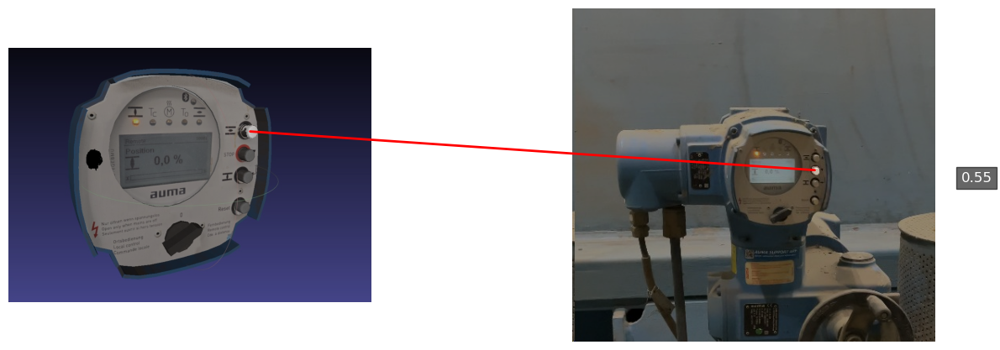

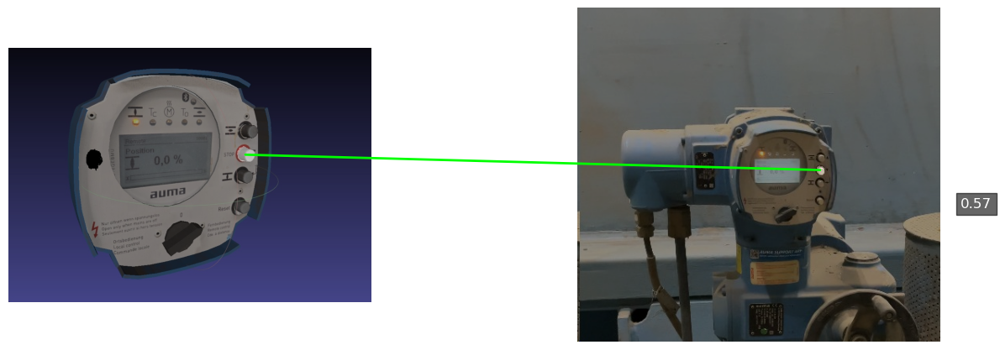

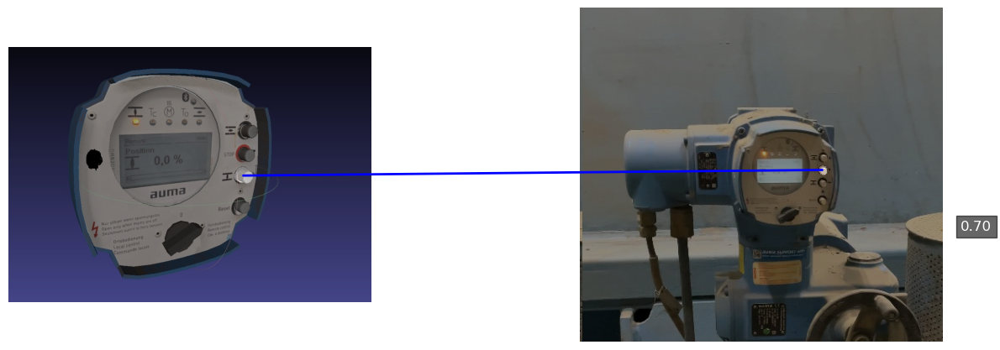

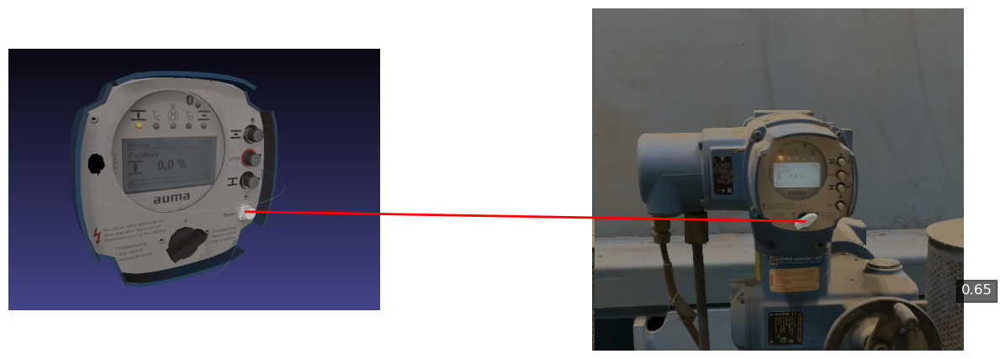

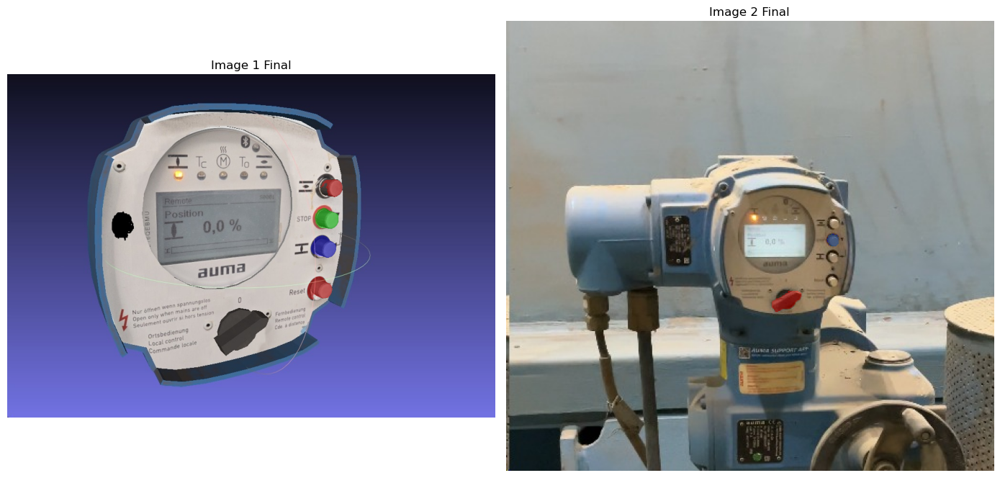

In [14]:

import os
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor

# ──────────────────────────────────────────────────────────────────────────────
# Simplified single-best matching pipeline with DINOv2 + SAM
# For each click-pair, finds the highest-similarity patch in img2
# and segments it. Repeats allowed; no filtering of duplicates.
# ──────────────────────────────────────────────────────────────────────────────

def main():
    # 1) Initialize device and models
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    dm = Dinov2Matcher(
        repo_name='facebookresearch/dinov2',
        model_name='dinov2_vitb14',
        smaller_edge_size=448,
        half_precision=False,
        device=device
    )
    sam = sam_model_registry['vit_b'](checkpoint='sam_vit_b_01ec64.pth').to(device)
    pred1 = SamPredictor(sam)
    pred2 = SamPredictor(sam)

    # 2) Load images
    img1 = cv2.cvtColor(cv2.imread(r'C:\Users\rebel\Desktop\Image 1.jpg'), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(r'C:\Users\rebel\Desktop\Image 2.jpg'), cv2.COLOR_BGR2RGB)

    # 3) Extract and normalize DINOv2 features
    t1, g1, s1 = dm.prepare_image(img1)
    t2, g2, s2 = dm.prepare_image(img2)
    with torch.inference_mode():
        f1 = torch.from_numpy(dm.extract_features(t1)).float().to(device)
        f2 = torch.from_numpy(dm.extract_features(t2)).float().to(device)
    f1n = F.normalize(f1, dim=1)
    f2n = F.normalize(f2, dim=1)

    # 4) Precompute patch centers for img1
    centers1 = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1n.shape[0])])

    # 5) Capture click-pairs on img1
    clicks = []
    cur = {'pos': None, 'neg': None}
    def on_mouse(evt, x, y, flags, param):
        if evt == cv2.EVENT_LBUTTONDOWN and cur['pos'] is None:
            cur['pos'] = (x, y)
        elif evt == cv2.EVENT_RBUTTONDOWN and cur['neg'] is None:
            cur['neg'] = (x, y)
        if cur['pos'] and cur['neg']:
            clicks.append((cur['pos'], cur['neg']))
            cur['pos'], cur['neg'] = None, None

    cv2.namedWindow("Click POS(L)/NEG(R) – q to quit", cv2.WINDOW_NORMAL)
    cv2.setMouseCallback("Click POS(L)/NEG(R) – q to quit", on_mouse)
    while True:
        cv2.imshow("Click POS(L)/NEG(R) – q to quit", img1[:, :, ::-1])
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()
    if not clicks:
        raise RuntimeError("No click-pairs captured.")

    # 6) Prepare canvases and palette
    canvas1, canvas2 = img1.copy(), img2.copy()
    palette = [(255,0,0), (0,255,0), (0,0,255)]
    alpha = 0.4

    # 7) For each click, find best match and segment
    for i, (pos, neg) in enumerate(clicks):
        # a) Segment clicked region in img1
        pred1.set_image(img1)
        m1s, s1s, _ = pred1.predict(
            point_coords=np.array([pos, neg]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        mask1 = (m1s[np.argmax(s1s)] * 255).astype(np.uint8)

        # b) Find source patch index
        src_idx = int(np.argmin(np.linalg.norm(centers1 - [pos[1], pos[0]], axis=1)))

        # c) Compute cosine similarities and pick top-1
        sims = (f2n @ f1n[src_idx]).cpu().numpy()
        best = int(np.argmax(sims))
        pos2 = dm.idx_to_source_position(best, g2, s2)[::-1]

        # d) Overlay mask1 on canvas1
        col = np.array(palette[i % len(palette)])/255.0
        b1 = mask1.astype(bool)
        canvas1[b1] = ((1-alpha)*canvas1[b1] + alpha*col*255).astype(np.uint8)

        # e) Segment best in img2
        pred2.set_image(img2)
        # Use img1 centroid as negative for consistency
        M1 = cv2.moments(mask1)
        cent1 = (int(M1['m10']/M1['m00']), int(M1['m01']/M1['m00']))
        m2s, s2s, _ = pred2.predict(
            point_coords=np.array([pos2, cent1]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        mask2 = (m2s[np.argmax(s2s)] * 255).astype(np.uint8)
        b2 = mask2.astype(bool)
        canvas2[b2] = ((1-alpha)*canvas2[b2] + alpha*col*255).astype(np.uint8)

        # f) Draw match line and annotation
        M2 = cv2.moments(mask2)
        c1 = cent1
        c2 = (int(M2['m10']/M2['m00']), int(M2['m01']/M2['m00']))

        fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,6))
        ax1.imshow(img1); ax1.imshow(mask1, alpha=0.4, cmap='gray'); ax1.axis('off')
        ax2.imshow(img2); ax2.imshow(mask2, alpha=0.4, cmap='gray'); ax2.axis('off')
        line = ConnectionPatch(xyA=c2, xyB=c1, coordsA='data', coordsB='data',
                               axesA=ax2, axesB=ax1, color=col, linewidth=2)
        ax2.add_artist(line)
        ax2.text((c1[0]+c2[0])//2, (c1[1]+c2[1])//2, f'{sims[best]:.2f}',
                 color='white', fontsize=12, bbox=dict(facecolor='black', alpha=0.6))
        plt.tight_layout(); plt.show()

    # 8) Show final canvases
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,7))
    ax1.imshow(canvas1); ax1.axis('off'); ax1.set_title('Image 1 Final')
    ax2.imshow(canvas2); ax2.axis('off'); ax2.set_title('Image 2 Final')
    plt.tight_layout(); plt.show()

if __name__ == '__main__':
    main()



Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


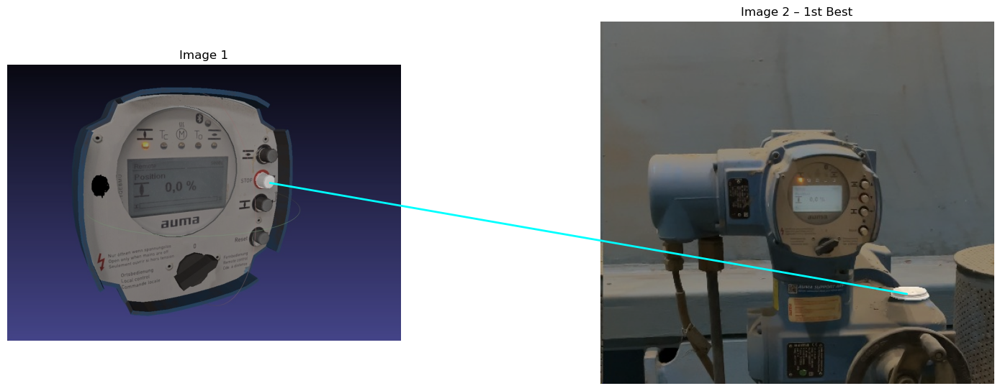

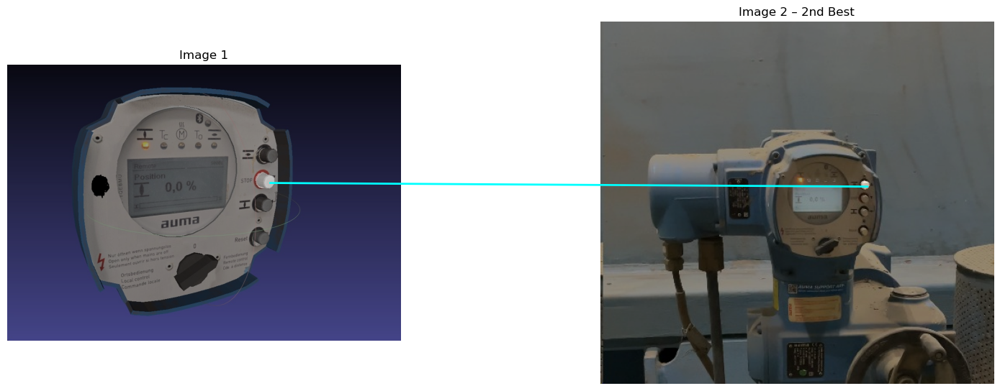

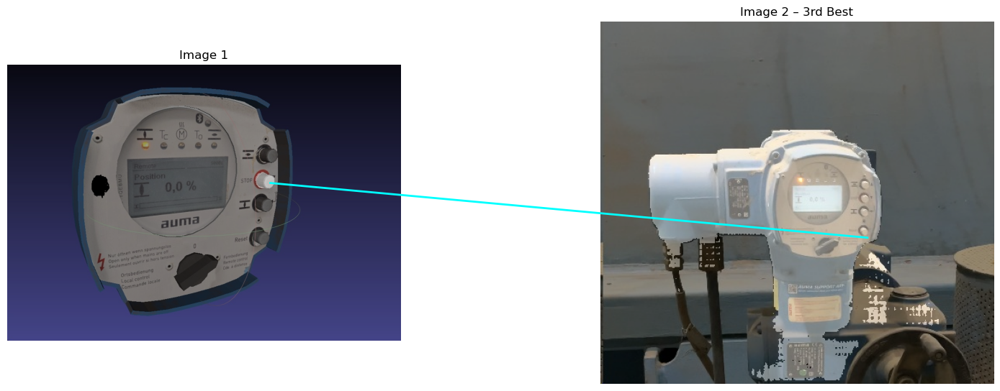

In [47]:
import os
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor

# ─── assume Dinov2Matcher is defined above and imported ─────────────────────
# from your_module import Dinov2Matcher

# 1) Init on GPU
device = "cuda"
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitl14",
    smaller_edge_size=896,
    half_precision=True,
    device=device,
)
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(device)
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# 2) Load images & clicks
img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)
clicks = {"pos": None, "neg": None}
def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    if evt == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS/NEG", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS/NEG", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS/NEG", on_mouse)
cv2.waitKey(0)
pos1, neg1 = clicks["pos"], clicks["neg"]

# 3) Extract & normalize features
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
t1, t2 = t1.half().to(device), t2.half().to(device)
with torch.inference_mode():
    f1 = torch.from_numpy(dm.extract_features(t1)).to(device)
    f2 = torch.from_numpy(dm.extract_features(t2)).to(device)
f1n = torch.nn.functional.normalize(f1, dim=1)
f2n = torch.nn.functional.normalize(f2, dim=1)

# 4) GPU topk + ratio + mutual
def topk(q, k):
    sims = (f2n @ q).cpu()
    return sims.topk(k).indices.tolist()

def ratio_match(idx, r=0.6):
    q = f1n[idx]
    i1, i2 = topk(q, 2)
    d1 = 1 - (f2n[i1] @ q).item()
    d2 = 1 - (f2n[i2] @ q).item()
    return i1 if d1 < r * d2 else None

def mutual(idx):
    m = ratio_match(idx)
    return m if (m is not None and ratio_match(m) == idx) else None

# 5) Map clicks → indices
centers1 = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1n.size(0))])
src_pos = int(np.argmin(np.linalg.norm(centers1 - [pos1[1], pos1[0]], axis=1)))
src_neg = int(np.argmin(np.linalg.norm(centers1 - [neg1[1], neg1[0]], axis=1)))

# 6) Get top-10 raw
raw10 = topk(f1n[src_pos], 10)

# 7) Pick 3 distinct positives (cast to ints before use)
DIST = 50
pos2_idxs = []
pos2_centers = []

for cand in raw10:
    if cand in pos2_idxs:
        continue
    # get float center then cast
    y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
    x, y = int(round(x_f)), int(round(y_f))
    pt = np.array([x, y])
    # spatial distinct?
    if any(np.linalg.norm(pt - c) < DIST for c in pos2_centers):
        continue
    # for 2nd/3rd: must lie inside SAM mask
    if pos2_idxs:
        predictor2.set_image(img2)
        masks, scores, _ = predictor2.predict(
            point_coords=np.array([pt, neg1]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        mask = masks[np.argmax(scores)]
        h, w = mask.shape
        if not (0 <= x < w and 0 <= y < h and mask[y, x]):
            continue
    # accept
    pos2_idxs.append(cand)
    pos2_centers.append(pt)
    if len(pos2_idxs) == 3:
        break

# fallback fill
for cand in raw10:
    if len(pos2_idxs) == 3:
        break
    if cand not in pos2_idxs:
        pos2_idxs.append(cand)
        y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
        pos2_centers.append(np.array([int(round(x_f)), int(round(y_f))]))

# 8) Negative idx (for segmentation)
neg2_idx = mutual(src_neg) or topk(f1n[src_neg], 1)[0]

# 9) Local refine
def refine(src_pt, init_pt, patch=128, rad=64):
    x1, y1 = src_pt; h1, w1,_ = img1.shape
    half = patch//2
    x1, y1 = np.clip(x1, half, w1-half), np.clip(y1, half, h1-half)
    tmpl = img1[y1-half:y1+half, x1-half:x1+half]
    x2, y2 = init_pt; h2, w2,_ = img2.shape
    x0, y0 = max(0, x2-rad), max(0, y2-rad)
    x1b, y1b = min(w2, x2+rad), min(h2, y2+rad)
    win = img2[y0:y1b, x0:x1b]
    _, _, _, loc = cv2.minMaxLoc(cv2.matchTemplate(win, tmpl, cv2.TM_CCOEFF_NORMED))
    return (x0 + loc[0] + half, y0 + loc[1] + half)

pos2_list = [
    refine(pos1, (
        int(round(dm.idx_to_source_position(i, g2, s2)[1])),
        int(round(dm.idx_to_source_position(i, g2, s2)[0]))
    ))
    for i in pos2_idxs
]

# 10) Visualize
titles = ["1st Best","2nd Best","3rd Best"]
for i, pt in enumerate(pos2_list):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1); ax1.imshow(m1[np.argmax(s1)], alpha=0.4, cmap="gray")
    ax1.axis("off"); ax1.set_title("Image 1")

    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2); ax2.imshow(m2[np.argmax(s2)], alpha=0.4, cmap="gray")
    ax2.axis("off"); ax2.set_title(f"Image 2 – {titles[i]}")

    con = ConnectionPatch(
        xyA=pt, xyB=pos1,
        coordsA="data", coordsB="data",
        axesA=ax2, axesB=ax1,
        color="cyan", linewidth=2
    )
    ax2.add_artist(con)

    plt.tight_layout()
    plt.show()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main



Cosine similarity scores for selected matches:
  Option 1 (feature idx 3296): 0.5493
  Option 2 (feature idx 1978): 0.4675
  Option 3 (feature idx 2599): 0.4202


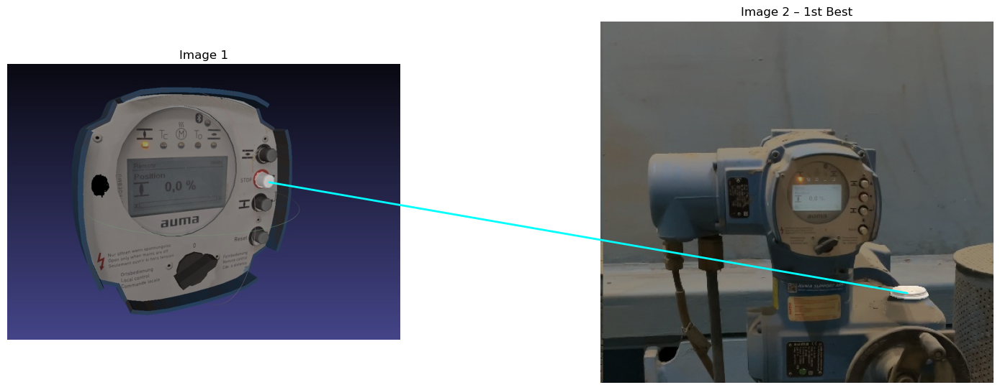

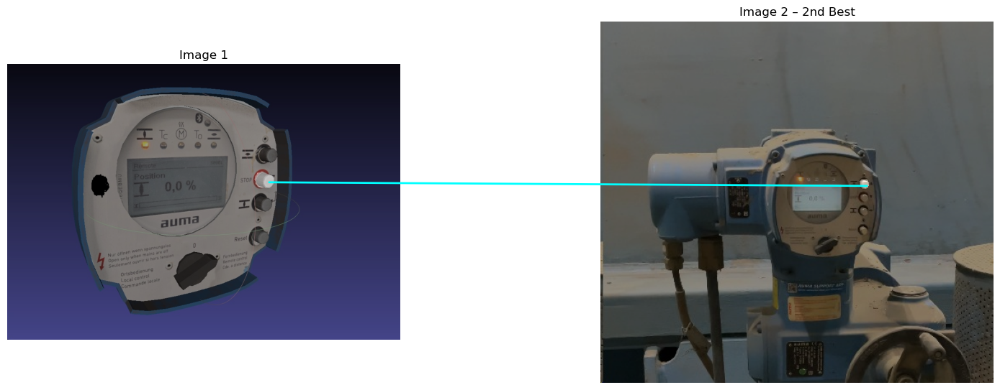

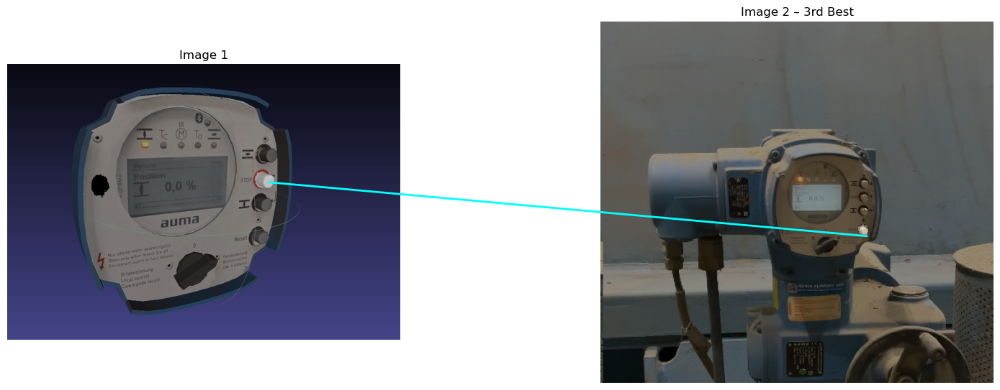

In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
# ─── assume Dinov2Matcher is defined above and imported ───
# from your_module import Dinov2Matcher

# 1) Init on GPU
device = "cuda"
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitl14",
    smaller_edge_size=896,
    half_precision=True,
    device=device,
)

# 2) Init SAM
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(device)
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# 3) Load images & collect clicks
img1 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 1.jpg"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(r"C:\Users\rebel\Desktop\Image 2.jpg"), cv2.COLOR_BGR2RGB)
clicks = {"pos": None, "neg": None}

def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    if evt == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS/NEG", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS/NEG", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS/NEG", on_mouse)
cv2.waitKey(0)
pos1, neg1 = clicks["pos"], clicks["neg"]

# 4) Extract & normalize features
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
t1, t2 = t1.half().to(device), t2.half().to(device)
with torch.inference_mode():
    f1 = torch.from_numpy(dm.extract_features(t1)).to(device)
    f2 = torch.from_numpy(dm.extract_features(t2)).to(device)
f1n = F.normalize(f1, dim=1)
f2n = F.normalize(f2, dim=1)

# 5) Helper functions
def topk(q, k):
    sims = (f2n @ q).cpu()
    return sims.topk(k).indices.tolist()

def ratio_match(idx, r=0.6):
    q = f1n[idx]
    i1, i2 = topk(q, 2)
    d1 = 1 - (f2n[i1] @ q).item()
    d2 = 1 - (f2n[i2] @ q).item()
    return i1 if d1 < r * d2 else None

def mutual(idx):
    m = ratio_match(idx)
    return m if (m is not None and ratio_match(m) == idx) else None

# 6) Map clicks → feature indices
centers1 = np.array([dm.idx_to_source_position(i, g1, s1) for i in range(f1n.size(0))])
src_pos = int(np.argmin(np.linalg.norm(centers1 - [pos1[1], pos1[0]], axis=1)))
src_neg = int(np.argmin(np.linalg.norm(centers1 - [neg1[1], neg1[0]], axis=1)))

# 7) Retrieve top-10 candidate matches
raw10 = topk(f1n[src_pos], 10)

# 8) Select 3 distinct positive matches
DIST = 50
pos2_idxs, pos2_centers = [], []
for cand in raw10:
    if cand in pos2_idxs:
        continue
    y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
    x, y = int(round(x_f)), int(round(y_f))
    pt = np.array([x, y])
    if any(np.linalg.norm(pt - c) < DIST for c in pos2_centers):
        continue
    if pos2_idxs:  # use SAM mask check for duplicates
        predictor2.set_image(img2)
        masks, scores, _ = predictor2.predict(
            point_coords=np.array([pt, neg1]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        m = masks[np.argmax(scores)]
        if not (0 <= x < m.shape[1] and 0 <= y < m.shape[0] and m[y, x]):
            continue
    pos2_idxs.append(cand)
    pos2_centers.append(pt)
    if len(pos2_idxs) == 3:
        break

# Fallback fill if fewer than 3
for cand in raw10:
    if len(pos2_idxs) == 3:
        break
    if cand not in pos2_idxs:
        pos2_idxs.append(cand)
        y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
        pos2_centers.append(np.array([int(round(x_f)), int(round(y_f))]))

# 9) Cosine similarity for each selected match
print("\nCosine similarity scores for selected matches:")
for i, idx in enumerate(pos2_idxs, start=1):
    sim = (f1n[src_pos] * f2n[idx]).sum().item()
    print(f"  Option {i} (feature idx {idx}): {sim:.4f}")

# 10) Determine a negative match index (for further use if needed)
neg2_idx = mutual(src_neg) or topk(f1n[src_neg], 1)[0]

# 11) Optional local refinement helper
def refine(src_pt, init_pt, patch=128, rad=64):
    x1, y1 = map(int, src_pt)
    h1, w1, _ = img1.shape
    half = patch // 2
    x1 = np.clip(x1, half, w1-half)
    y1 = np.clip(y1, half, h1-half)
    tmpl = img1[y1-half:y1+half, x1-half:x1+half]

    x2, y2 = map(int, init_pt)
    h2, w2, _ = img2.shape
    x0 = max(0, x2-rad); y0 = max(0, y2-rad)
    x1b = min(w2, x2+rad); y1b = min(h2, y2+rad)
    win = img2[y0:y1b, x0:x1b]
    _, _, _, loc = cv2.minMaxLoc(cv2.matchTemplate(win, tmpl, cv2.TM_CCOEFF_NORMED))
    return (x0 + loc[0] + half, y0 + loc[1] + half)

# 12) Refine each positive match to pixel coordinates (if desired)
pos2_list = [refine(pos1, dm.idx_to_source_position(i, g2, s2)[::-1]) for i in pos2_idxs]

# 13) Visualize the matches (optional)
titles = ["1st Best", "2nd Best", "3rd Best"]
for i, pt in enumerate(pos2_list):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1)
    ax1.imshow(m1[np.argmax(s1)], alpha=0.4, cmap="gray")
    ax1.axis("off"); ax1.set_title("Image 1")

    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2)
    ax2.imshow(m2[np.argmax(s2)], alpha=0.4, cmap="gray")
    ax2.axis("off"); ax2.set_title(f"Image 2 – {titles[i]}")

    con = ConnectionPatch(
        xyA=pt, xyB=pos1, coordsA="data", coordsB="data",
        axesA=ax2, axesB=ax1, color="cyan", linewidth=2
    )
    ax2.add_artist(con)
    plt.tight_layout()
    plt.show()
sel = input("Which options are CORRECT? (e.g. 1,3 or 'all'): ").strip().lower()
chosen = [0,1,2] if sel=="all" else [int(x)-1 for x in sel.split(",") if x.isdigit()]

LOG_CSV = "correction.csv"
if not os.path.isfile(LOG_CSV):
    with open(LOG_CSV,"w",newline="") as f:
        csv.writer(f).writerow(["img1","x1","y1","img2","x2","y2"])

for i in chosen:
    x2,y2 = pos2_list[i]
    with open(LOG_CSV,"a",newline="") as f:
        csv.writer(f).writerow([
            r"C:\Users\rebel\Desktop\Image 2.jpg", pos1[0],pos1[1],
            r"C:\Users\rebel\Desktop\Image 1.jpg", x2,y2
        ])
print(f"Logged {len(chosen)} corrections to '{LOG_CSV}'")

# ─────────────────────────────────────────────────────────────────────────────
# B) Fine‐tune Adapter from logs
# ─────────────────────────────────────────────────────────────────────────────

# (1) Probe feature dim once:
with open(LOG_CSV) as f:
    reader = csv.reader(f); next(reader)
    img1_p, x1,y1,_,_,_ = next(reader)
sample = cv2.cvtColor(cv2.imread(img1_p), cv2.COLOR_BGR2RGB)
t0, g0, s0 = dm.prepare_image(sample)
FEATURE_DIM = dm.extract_features(t0).shape[1]

# (2) Dataset & Adapter class
class CorrectionDataset(Dataset):
    def __init__(self,csv_path,dm):
        self.dm, self.rows = dm, list(csv.reader(open(csv_path)))[1:]
    def __len__(self): return len(self.rows)
    def __getitem__(self,i):
        img1_p,x1,y1,img2_p,x2,y2 = self.rows[i]
        x1,y1,x2,y2 = map(int,(x1,y1,x2,y2))
        I1 = cv2.cvtColor(cv2.imread(img1_p),cv2.COLOR_BGR2RGB)
        I2 = cv2.cvtColor(cv2.imread(img2_p),cv2.COLOR_BGR2RGB)
        t1,g1,s1 = dm.prepare_image(I1)
        t2,g2,s2 = dm.prepare_image(I2)
        F1, F2 = dm.extract_features(t1), dm.extract_features(t2)
        # find nearest patch indices via centers
        c1 = np.array([dm.idx_to_source_position(j,g1,s1) for j in range(F1.shape[0])])
        c2 = np.array([dm.idx_to_source_position(j,g2,s2) for j in range(F2.shape[0])])
        ia = int(np.argmin(np.linalg.norm(c1 - [y1,x1],axis=1)))
        ip = int(np.argmin(np.linalg.norm(c2 - [y2,x2],axis=1)))
        anc = torch.from_numpy(F1[ia]).float()
        pos = torch.from_numpy(F2[ip]).float()
        all_idxs = np.delete(np.arange(F2.shape[0]), ip)
        negs_idx = np.random.choice(all_idxs, size=5, replace=False)
        negs = torch.from_numpy(F2[negs_idx]).float()
        return anc, pos, negs

class Adapter(nn.Module):
    def __init__(self,dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim,dim//2), nn.ReLU(),
            nn.Linear(dim//2,dim)
        )
    def forward(self,x): return F.normalize(self.net(x),dim=-1)

# (3) Training loop
def finetune_adapter(csv_path="correction.csv", epochs=5):
    ds = CorrectionDataset(csv_path, dm)
    dl = DataLoader(ds, batch_size=8, shuffle=True)
    adapter = Adapter(FEATURE_DIM).to(device)
    if os.path.isfile("adapters.pth"):
        adapter.load_state_dict(torch.load("adapters.pth",map_location=device))
    opt = optim.Adam(adapter.parameters(), lr=1e-4)
    loss_fn = nn.MarginRankingLoss(margin=0.5)

    for ep in range(1,epochs+1):
        
        total=0
        for anc,pos,negs in dl:
            anc,pos,negs = anc.to(device), pos.to(device), negs.to(device)
            ae, pe = adapter(anc), adapter(pos)
            s_pos = (ae*pe).sum(dim=1)
            B,K,D = negs.shape
            ne = adapter(negs.view(-1,D)).view(B,K,D)
            s_neg,_ = (ae.unsqueeze(1)*ne).sum(dim=2).max(dim=1)
            loss = loss_fn(s_pos, s_neg, torch.ones_like(s_pos))
            opt.zero_grad(); loss.backward(); opt.step()
            total += loss.item()
        print(f"Epoch {ep}/{epochs} – Avg Loss {total/len(dl):.4f}")

    torch.save(adapter.state_dict(),"adapters.pth")
    print("✅ Saved adapters.pth")

# (4) Retrain if ≥50 corrections
N = sum(1 for _ in open(LOG_CSV)) - 1
if N >= 50:
    print(f"{N} corrections logged ⇒ retraining adapter…")
    finetune_adapter()

In [14]:
# adapter_train.py
import os
import csv
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from pathlib import Path


CSV_PATH   = "correction.csv"   # logged (img1,x1,y1,img2,x2,y2)
DEVICE     = "cuda"
BATCH_SIZE = 32
NEG_K      = 10                 # negatives / anchor
LR         = 1e-3
EPOCHS     = 10
MARGIN     = 0.5
CLIP_NORM  = 1.0

# ─── 1) Init frozen DINOv2 matcher ─────────────────────────────────────────
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitl14",
    smaller_edge_size=896,
    half_precision=True,
    device=DEVICE,
)

# ─── 2) Probe feature dimension once (for adapter size) ─────────────────────
with open(CSV_PATH) as f:
    reader = csv.reader(f); next(reader)
    img1_p, *_ = next(reader)
feat_dim = dm.extract_features(dm.prepare_image(cv2.cvtColor(
             cv2.imread(img1_p), cv2.COLOR_BGR2RGB))[0]).shape[1]

# ─── 3) Dataset loading frozen features on-the-fly ──────────────────────────
class CorrectionDataset(Dataset):
    def __init__(self, csv_path, matcher):
        self.rows   = list(csv.reader(open(csv_path)))[1:]  # skip header
        self.dm     = matcher

    def __len__(self): return len(self.rows)

    def __getitem__(self, idx):
        img1_p,x1,y1,img2_p,x2,y2 = self.rows[idx]
        x1,y1,x2,y2 = map(int, (x1,y1,x2,y2))

        # load RGB images
        I1 = cv2.cvtColor(cv2.imread(img1_p), cv2.COLOR_BGR2RGB)
        I2 = cv2.cvtColor(cv2.imread(img2_p), cv2.COLOR_BGR2RGB)

        with torch.no_grad():                  # >>> FROZEN DINOv2 <<<
            t1,g1,s1 = self.dm.prepare_image(I1)
            t2,g2,s2 = self.dm.prepare_image(I2)
            F1 = self.dm.extract_features(t1)   # [N1, D]
            F2 = self.dm.extract_features(t2)   # [N2, D]

        # map click coords to nearest patch
        c1 = np.array([self.dm.idx_to_source_position(i,g1,s1)
                       for i in range(F1.shape[0])])
        c2 = np.array([self.dm.idx_to_source_position(i,g2,s2)
                       for i in range(F2.shape[0])])
        ia = int(np.argmin(np.linalg.norm(c1 - [y1,x1], axis=1)))
        ip = int(np.argmin(np.linalg.norm(c2 - [y2,x2], axis=1)))

        # build anchor / positive / negatives tensors
        anc = torch.from_numpy(F1[ia]).float()
        pos = torch.from_numpy(F2[ip]).float()

        neg_candidates = np.delete(np.arange(F2.shape[0]), ip)
        neg_idx = np.random.choice(neg_candidates, size=NEG_K, replace=False)
        negs = torch.from_numpy(F2[neg_idx]).float()          # [K, D]
        return anc, pos, negs

# ─── 4) Adapter definition (trainable) ──────────────────────────────────────
class Adapter(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, dim//2),
            nn.ReLU(inplace=True),
            nn.Linear(dim//2, dim)
        )
    def forward(self, x):         # x: [..., D]
        return F.normalize(self.net(x), dim=-1)

# ─── 5) Training loop ───────────────────────────────────────────────────────
def train():
    ds = CorrectionDataset(CSV_PATH, dm)
    dl = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)

    adapter = Adapter(feat_dim).to(DEVICE)
    if Path("adapters.pth").is_file():
        adapter.load_state_dict(torch.load("adapters.pth", map_location=DEVICE))
        print("✓ Loaded existing adapters.pth")

    opt  = torch.optim.AdamW(adapter.parameters(), lr=LR)
    sched = ReduceLROnPlateau(opt, factor=0.5, patience=2)

    loss_fn = nn.MarginRankingLoss(margin=MARGIN)

    # baseline similarity logging
    anc0,pos0,neg0 = next(iter(dl))
    with torch.no_grad():
        a0 = adapter(anc0.to(DEVICE))
        p0 = adapter(pos0.to(DEVICE))
        n0 = adapter(neg0.to(DEVICE).view(-1,feat_dim)).view(-1,NEG_K,feat_dim)
        print(f"[Baseline]  cos(pos)={ (a0*p0).sum(1).mean():.4f} | "
              f"cos(neg)={ (a0.unsqueeze(1)*n0).sum(2).max(1)[0].mean():.4f}")

    for epoch in range(1, EPOCHS+1):
        adapter.train()
        running = 0.
        for anc,pos,negs in dl:
            anc,pos,negs = anc.to(DEVICE), pos.to(DEVICE), negs.to(DEVICE)
            letA, letP = adapter(anc), adapter(pos)           # [B,D]
            letN = adapter(negs.view(-1, feat_dim)).view(-1,NEG_K,feat_dim)

            pos_sim = (letA * letP).sum(1)                    # [B]
            neg_sim,_= (letA.unsqueeze(1)*letN).sum(2).max(1) # hardest neg

            loss = loss_fn(pos_sim, neg_sim, torch.ones_like(pos_sim))
            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(adapter.parameters(), CLIP_NORM)
            opt.step()
            running += loss.item()

        avg_loss = running / len(dl)
        print(f"Epoch {epoch}/{EPOCHS}  |  loss = {avg_loss:.4f}")
        sched.step(avg_loss)

    # post-training similarity
    adapter.eval()
    with torch.no_grad():
        a1 = adapter(anc0.to(DEVICE))
        p1 = adapter(pos0.to(DEVICE))
        n1 = adapter(neg0.to(DEVICE).view(-1,feat_dim)).view(-1,NEG_K,feat_dim)
        print(f"[Post-train] cos(pos)={ (a1*p1).sum(1).mean():.4f} | "
              f"cos(neg)={ (a1.unsqueeze(1)*n1).sum(2).max(1)[0].mean():.4f}")

    torch.save(adapter.state_dict(), "adapters.pth")
    print("✅ Adapter saved to adapters.pth")

# ─── 6) Run training ────────────────────────────────────────────────────────
if __name__ == "__main__":
    train()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


✓ Loaded existing adapters.pth
[Baseline]  cos(pos)=0.9139 | cos(neg)=-0.3111
Epoch 1/10  |  loss = 0.0000
Epoch 2/10  |  loss = 0.0226
Epoch 3/10  |  loss = 0.0107
Epoch 4/10  |  loss = 0.0000
Epoch 5/10  |  loss = 0.0169
Epoch 6/10  |  loss = 0.0000
Epoch 7/10  |  loss = 0.0321
Epoch 8/10  |  loss = 0.0000
Epoch 9/10  |  loss = 0.0278
Epoch 10/10  |  loss = 0.0000
[Post-train] cos(pos)=0.9240 | cos(neg)=-0.4476
✅ Adapter saved to adapters.pth


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main



Cosine similarity scores (NO adapter):
  Option 1 (idx 3296): 0.5493
  Option 2 (idx 1978): 0.4675
  Option 3 (idx 2599): 0.4202


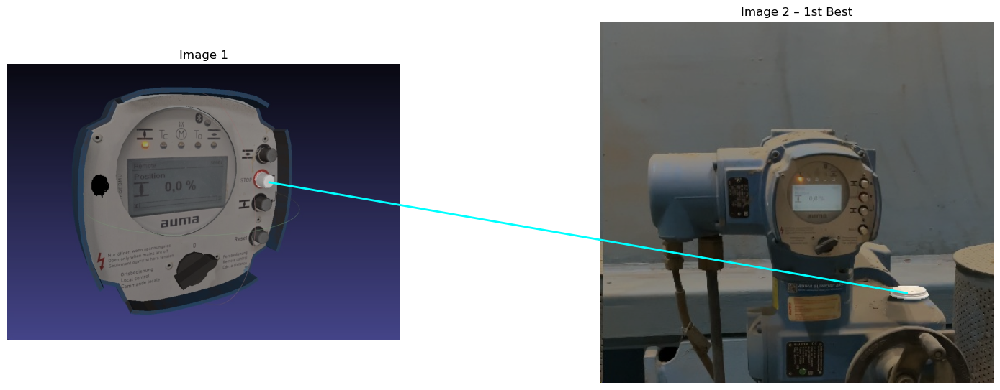

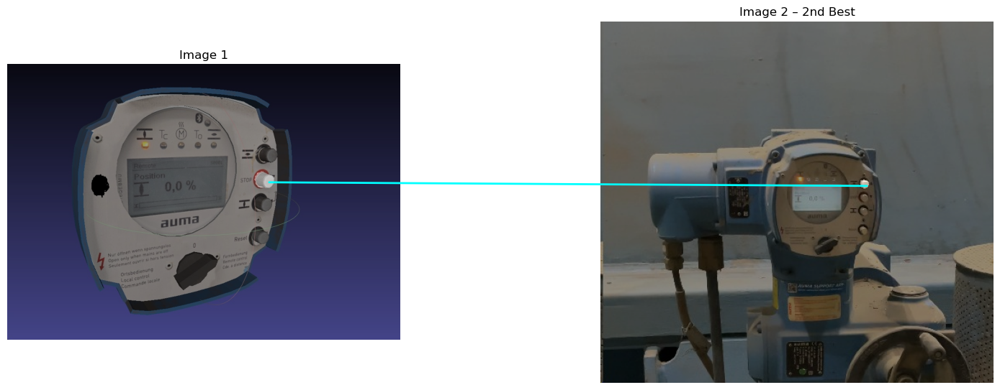

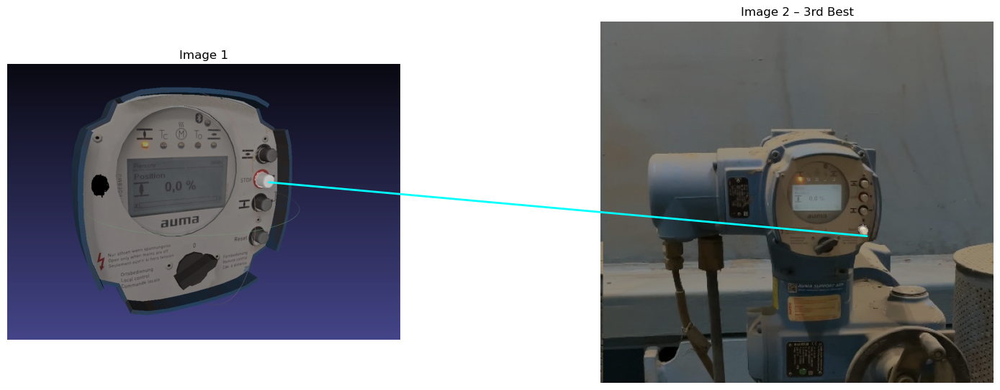

In [48]:
import os
import csv
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor

# ─── import your frozen DINOv2 matcher (unchanged) ───────────────────────────
# from your_module import Dinov2Matcher

# ---------------------------------------------------------------------------
IMG1_PATH = r"C:\Users\rebel\Desktop\Image 1.jpg"
IMG2_PATH = r"C:\Users\rebel\Desktop\Image 2.jpg"
DEVICE    = "cuda" if torch.cuda.is_available() else "cpu"
# ---------------------------------------------------------------------------

# 1) Init frozen DINOv2 matcher
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitl14",
    smaller_edge_size=896,
    half_precision=True,
    device=DEVICE,
)

# 2) Init SAM (for duplicate-mask filtering)
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(DEVICE)
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# 3) Load images & collect clicks
img1 = cv2.cvtColor(cv2.imread(IMG1_PATH), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(IMG2_PATH), cv2.COLOR_BGR2RGB)
clicks = {"pos": None, "neg": None}

def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    if evt == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS/NEG", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS/NEG", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS/NEG", on_mouse)
cv2.waitKey(0)
pos1, neg1 = clicks["pos"], clicks["neg"]

# 4) Extract & normalize DINOv2 features (NO adapter)
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
with torch.inference_mode():
    f1 = torch.from_numpy(dm.extract_features(t1)).to(DEVICE)
    f2 = torch.from_numpy(dm.extract_features(t2)).to(DEVICE)
f1n = F.normalize(f1, dim=1)
f2n = F.normalize(f2, dim=1)

# 5) Matching helpers
def topk(q, k):
    sims = (f2n @ q).cpu()
    return sims.topk(k).indices.tolist()

def ratio_match(idx, r=0.6):
    q = f1n[idx]
    i1, i2 = topk(q, 2)
    d1 = 1 - (f2n[i1] @ q).item()
    d2 = 1 - (f2n[i2] @ q).item()
    return i1 if d1 < r * d2 else None

def mutual(idx):
    m = ratio_match(idx)
    return m if (m is not None and ratio_match(m) == idx) else None

# 6) Convert clicks to feature indices
centers1 = np.array([dm.idx_to_source_position(i, g1, s1)
                     for i in range(f1n.size(0))])
src_pos = int(np.argmin(np.linalg.norm(centers1 - [pos1[1], pos1[0]], axis=1)))
src_neg = int(np.argmin(np.linalg.norm(centers1 - [neg1[1], neg1[0]], axis=1)))

# 7) Retrieve top-10 & choose 3 distinct positive matches
raw10 = topk(f1n[src_pos], 10)
DIST = 50
pos2_idxs, pos2_centers = [], []
for cand in raw10:
    if cand in pos2_idxs:
        continue
    y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
    x, y = int(round(x_f)), int(round(y_f))
    pt = np.array([x, y])
    if any(np.linalg.norm(pt - c) < DIST for c in pos2_centers):
        continue
    if pos2_idxs:                 # duplicate-mask guard
        predictor2.set_image(img2)
        masks, scores, _ = predictor2.predict(
            point_coords=np.array([pt, neg1]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        m = masks[np.argmax(scores)]
        if not (0 <= x < m.shape[1] and 0 <= y < m.shape[0] and m[y, x]):
            continue
    pos2_idxs.append(cand)
    pos2_centers.append(pt)
    if len(pos2_idxs) == 3:
        break

# Fallback fill
for cand in raw10:
    if len(pos2_idxs) == 3:
        break
    if cand not in pos2_idxs:
        pos2_idxs.append(cand)
        y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
        pos2_centers.append(np.array([int(round(x_f)), int(round(y_f))]))

# 8) Cosine similarity for each selected match (raw DINO space)
print("\nCosine similarity scores (NO adapter):")
for i, idx in enumerate(pos2_idxs, 1):
    sim = (f1n[src_pos] * f2n[idx]).sum().item()
    print(f"  Option {i} (idx {idx}): {sim:.4f}")

# 9) (Optional) visualize like before – same as adapted script
def refine(src_pt, init_pt, patch=128, rad=64):
    x1, y1 = map(int, src_pt)
    h1, w1, _ = img1.shape
    half = patch // 2
    x1 = np.clip(x1, half, w1-half)
    y1 = np.clip(y1, half, h1-half)
    tmpl = img1[y1-half:y1+half, x1-half:x1+half]
    x2, y2 = map(int, init_pt)
    h2, w2, _ = img2.shape
    x0 = max(0, x2-rad); y0 = max(0, y2-rad)
    x1b = min(w2, x2+rad); y1b = min(h2, y2+rad)
    win = img2[y0:y1b, x0:x1b]
    _, _, _, loc = cv2.minMaxLoc(cv2.matchTemplate(win, tmpl, cv2.TM_CCOEFF_NORMED))
    return (x0 + loc[0] + half, y0 + loc[1] + half)

pos2_list = [refine(pos1, dm.idx_to_source_position(i, g2, s2)[::-1])
             for i in pos2_idxs]

titles = ["1st Best", "2nd Best", "3rd Best"]
for i, pt in enumerate(pos2_list):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1); ax1.imshow(m1[np.argmax(s1)], alpha=0.4, cmap="gray")
    ax1.axis("off"); ax1.set_title("Image 1")
    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2); ax2.imshow(m2[np.argmax(s2)], alpha=0.4, cmap="gray")
    ax2.axis("off"); ax2.set_title(f"Image 2 – {titles[i]}")
    con = ConnectionPatch(xyA=pt, xyB=pos1,
                          coordsA="data", coordsB="data",
                          axesA=ax2, axesB=ax1,
                          color="cyan", linewidth=2)
    ax2.add_artist(con)
    plt.tight_layout(); plt.show()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main


✓ adapter loaded

Cosine similarity scores (with adapter):
  Option 1 (idx 2323): 0.9551
  Option 2 (idx 3296): 0.5870
  Option 3 (idx 1978): 0.9475


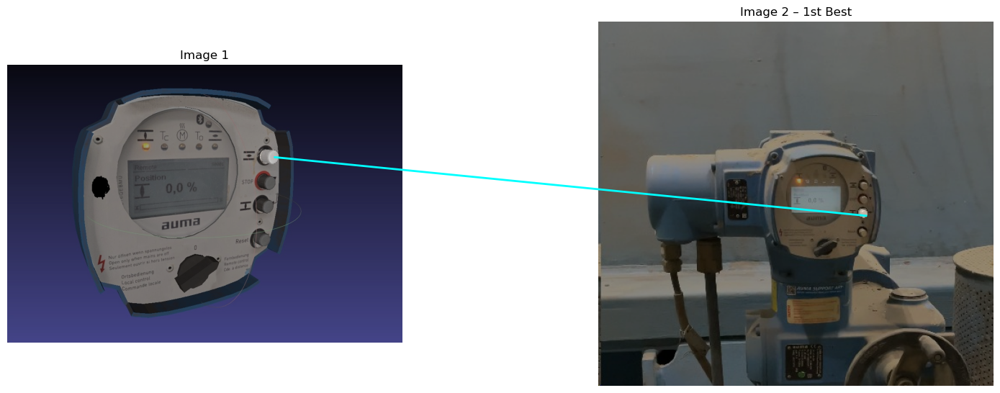

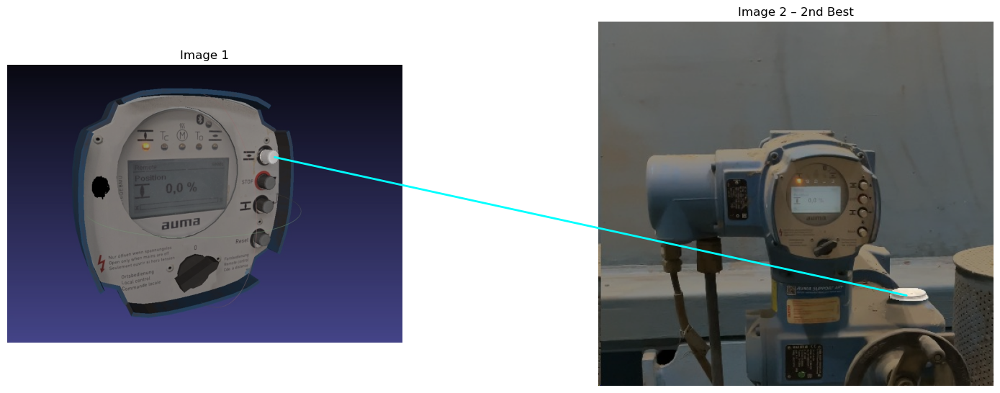

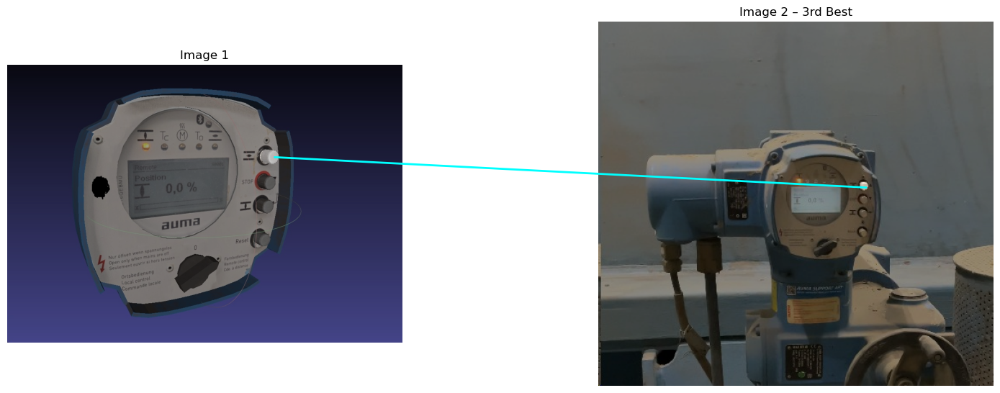

Which options are CORRECT? (e.g. 1,3 or 'all'):  3


Logged 1 corrections ➜ correction.csv


In [36]:
import os
import csv
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor
from PIL import Image

# ─── import your frozen DINOv2 matcher ─────────────────────────────────────
# from your_module import Dinov2Matcher

# ─── CONFIG ────────────────────────────────────────────────────────────────
IMG1_PATH = r"C:\Users\rebel\Desktop\Image 1.jpg"
IMG2_PATH = r"C:\Users\rebel\Desktop\Image 2.jpg"
LOG_CSV   = "correction.csv"
DEVICE    = "cuda"

# ─── 1) Init DINOv2 (frozen) ───────────────────────────────────────────────
dm = Dinov2Matcher(
    repo_name="facebookresearch/dinov2",
    model_name="dinov2_vitl14",
    smaller_edge_size=896,
    half_precision=True,
    device=DEVICE,
)

# ─── 2) Adapter class + load weights (if any) ──────────────────────────────
class Adapter(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, dim // 2),
            nn.ReLU(inplace=True),
            nn.Linear(dim // 2, dim)
        )
    def forward(self, x):
        return F.normalize(self.net(x), dim=-1)

# probe feature dimension once
_probe = np.zeros((8, 8, 3), np.uint8)
feat_dim = dm.extract_features(dm.prepare_image(_probe)[0]).shape[1]

adapter = Adapter(feat_dim).to(DEVICE)
if os.path.isfile("adapters.pth"):
    adapter.load_state_dict(torch.load("adapters.pth", map_location=DEVICE))
    adapter.eval()
    print("✓ adapter loaded")
else:
    print("⚠️ adapters.pth not found — using raw DINO features")

# ─── 3) Init SAM (for duplicate-mask filtering) ────────────────────────────
sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(DEVICE)
predictor1 = SamPredictor(sam)
predictor2 = SamPredictor(sam)

# ─── 4) Load images & collect POS / NEG clicks ─────────────────────────────
img1 = cv2.cvtColor(cv2.imread(IMG1_PATH), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(IMG2_PATH), cv2.COLOR_BGR2RGB)
clicks = {"pos": None, "neg": None}

def on_mouse(evt, x, y, flags, param):
    if evt == cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None:
        clicks["pos"] = (x, y)
    if evt == cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None:
        clicks["neg"] = (x, y)
    if clicks["pos"] and clicks["neg"]:
        cv2.destroyAllWindows()

cv2.namedWindow("Click POS/NEG", cv2.WINDOW_NORMAL)
cv2.imshow("Click POS/NEG", img1[:, :, ::-1])
cv2.setMouseCallback("Click POS/NEG", on_mouse)
cv2.waitKey(0)
pos1, neg1 = clicks["pos"], clicks["neg"]

# ─── 5) Extract DINOv2 features → adapter → L2-normalize ───────────────────
t1, g1, s1 = dm.prepare_image(img1)
t2, g2, s2 = dm.prepare_image(img2)
with torch.inference_mode():
    f1 = adapter(torch.from_numpy(dm.extract_features(t1)).to(DEVICE).float())
    f2 = adapter(torch.from_numpy(dm.extract_features(t2)).to(DEVICE).float())

f1n = F.normalize(f1, dim=1)
f2n = F.normalize(f2, dim=1)

# ─── 6) Matching helpers ───────────────────────────────────────────────────
def topk(q, k):
    sims = (f2n @ q).cpu()
    return sims.topk(k).indices.tolist()

def ratio_match(idx, r=0.6):
    q = f1n[idx]
    i1, i2 = topk(q, 2)
    d1 = 1 - (f2n[i1] @ q).item()
    d2 = 1 - (f2n[i2] @ q).item()
    return i1 if d1 < r * d2 else None

def mutual(idx):
    m = ratio_match(idx)
    return m if (m is not None and ratio_match(m) == idx) else None

# ─── 7) Map clicks → feature indices ───────────────────────────────────────
centers1 = np.array([dm.idx_to_source_position(i, g1, s1)
                     for i in range(f1n.size(0))])
src_pos = int(np.argmin(np.linalg.norm(centers1 - [pos1[1], pos1[0]], axis=1)))
src_neg = int(np.argmin(np.linalg.norm(centers1 - [neg1[1], neg1[0]], axis=1)))

# ─── 8) Retrieve top-10 & pick 3 distinct positives (mask-aware) ───────────
raw10 = topk(f1n[src_pos], 10)
DIST = 50
pos2_idxs, pos2_centers = [], []
for cand in raw10:
    if cand in pos2_idxs:
        continue
    y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
    x, y = int(round(x_f)), int(round(y_f))
    pt = np.array([x, y])
    if any(np.linalg.norm(pt - c) < DIST for c in pos2_centers):
        continue
    if pos2_idxs:
        predictor2.set_image(img2)
        masks, scores, _ = predictor2.predict(
            point_coords=np.array([pt, neg1]),
            point_labels=np.array([1, 0]),
            multimask_output=True
        )
        m = masks[np.argmax(scores)]
        if not (0 <= x < m.shape[1] and 0 <= y < m.shape[0] and m[y, x]):
            continue
    pos2_idxs.append(cand)
    pos2_centers.append(pt)
    if len(pos2_idxs) == 3:
        break
# fallback fill
for cand in raw10:
    if len(pos2_idxs) == 3:
        break
    if cand not in pos2_idxs:
        pos2_idxs.append(cand)
        y_f, x_f = dm.idx_to_source_position(cand, g2, s2)
        pos2_centers.append(np.array([int(round(x_f)), int(round(y_f))]))

# ─── 9) Print cosine similarity for the selections (adapter space) ─────────
print("\nCosine similarity scores (with adapter):")
for i, idx in enumerate(pos2_idxs, 1):
    sim = (f1n[src_pos] * f2n[idx]).sum().item()
    print(f"  Option {i} (idx {idx}): {sim:.4f}")

# ─── 10) Optional local refinement + visualisation ─────────────────────────
def refine(src_pt, init_pt, patch=128, rad=64):
    x1, y1 = map(int, src_pt)
    h1, w1, _ = img1.shape
    half = patch // 2
    x1 = np.clip(x1, half, w1-half)
    y1 = np.clip(y1, half, h1-half)
    tmpl = img1[y1-half:y1+half, x1-half:x1+half]
    x2, y2 = map(int, init_pt)
    h2, w2, _ = img2.shape
    x0 = max(0, x2-rad); y0 = max(0, y2-rad)
    x1b = min(w2, x2+rad); y1b = min(h2, y2+rad)
    win = img2[y0:y1b, x0:x1b]
    _, _, _, loc = cv2.minMaxLoc(cv2.matchTemplate(win, tmpl, cv2.TM_CCOEFF_NORMED))
    return (x0 + loc[0] + half, y0 + loc[1] + half)

pos2_list = [refine(pos1, dm.idx_to_source_position(i, g2, s2)[::-1])
             for i in pos2_idxs]

titles = ["1st Best", "2nd Best", "3rd Best"]
for i, pt in enumerate(pos2_list):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]), point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1); ax1.imshow(m1[np.argmax(s1)], alpha=0.4, cmap="gray")
    ax1.axis("off"); ax1.set_title("Image 1")
    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]), point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2); ax2.imshow(m2[np.argmax(s2)], alpha=0.4, cmap="gray")
    ax2.axis("off"); ax2.set_title(f"Image 2 – {titles[i]}")
    con = ConnectionPatch(xyA=pt, xyB=pos1,
                          coordsA="data", coordsB="data",
                          axesA=ax2, axesB=ax1,
                          color="cyan", linewidth=2)
    ax2.add_artist(con)
    plt.tight_layout(); plt.show()

# ─── 11) Prompt & log corrections ──────────────────────────────────────────
sel = input("Which options are CORRECT? (e.g. 1,3 or 'all'): ").strip().lower()
chosen = [0,1,2] if sel == "all" else [int(x)-1 for x in sel.split(",") if x.isdigit()]

if not os.path.isfile(LOG_CSV):
    with open(LOG_CSV, "w", newline="") as f:
        csv.writer(f).writerow(["img1","x1","y1","img2","x2","y2"])

for i in chosen:
    x2, y2 = pos2_list[i]
    with open(LOG_CSV, "a", newline="") as f:
        csv.writer(f).writerow([IMG1_PATH, pos1[0], pos1[1],
                                IMG2_PATH, x2, y2])
print(f"Logged {len(chosen)} corrections ➜ {LOG_CSV}")

# ─── 12) Dataset class that uses the adapter ───────────────────────────────
class CorrectionDataset(Dataset):
    def __init__(self, csv_path, matcher, adapter_mod):
        self.rows = list(csv.reader(open(csv_path)))[1:]  # skip header
        self.dm = matcher
        self.adapter = adapter_mod
    def __len__(self):
        return len(self.rows)
    def __getitem__(self, idx):
        img1_p,x1,y1,img2_p,x2,y2 = self.rows[idx]
        x1,y1,x2,y2 = map(int, (x1,y1,x2,y2))
        I1 = cv2.cvtColor(cv2.imread(img1_p), cv2.COLOR_BGR2RGB)
        I2 = cv2.cvtColor(cv2.imread(img2_p), cv2.COLOR_BGR2RGB)
        with torch.no_grad():
            t1,g1,s1 = self.dm.prepare_image(I1)
            t2,g2,s2 = self.dm.prepare_image(I2)
            F1 = self.adapter(torch.from_numpy(self.dm.extract_features(t1)).to(DEVICE)).cpu().numpy()
            F2 = self.adapter(torch.from_numpy(self.dm.extract_features(t2)).to(DEVICE)).cpu().numpy()
        c1 = np.array([self.dm.idx_to_source_position(i,g1,s1) for i in range(F1.shape[0])])
        c2 = np.array([self.dm.idx_to_source_position(i,g2,s2) for i in range(F2.shape[0])])
        ia = int(np.argmin(np.linalg.norm(c1 - [y1,x1], axis=1)))
        ip = int(np.argmin(np.linalg.norm(c2 - [y2,x2], axis=1)))
        anc = torch.from_numpy(F1[ia]).float()
        pos = torch.from_numpy(F2[ip]).float()
        neg_pool = np.delete(np.arange(F2.shape[0]), ip)
        neg_idx  = np.random.choice(neg_pool, 5, replace=False)
        negs = torch.from_numpy(F2[neg_idx]).float()
        return anc, pos, negs

# ─── 13) Fine-tune adapter when enough corrections are logged ──────────────
def finetune_adapter(csv_path=LOG_CSV, epochs=5):
    ds = CorrectionDataset(csv_path, dm, adapter)
    dl = DataLoader(ds, batch_size=8, shuffle=True)
    opt = optim.Adam(adapter.parameters(), lr=1e-4)
    loss_fn = nn.MarginRankingLoss(margin=0.5)

    for ep in range(1, epochs+1):
        total = 0.0
        for anc, pos, negs in dl:
            anc, pos, negs = anc.to(DEVICE), pos.to(DEVICE), negs.to(DEVICE)
            ae, pe = adapter(anc), adapter(pos)
            s_pos = (ae * pe).sum(1)
            B,K,D = negs.shape
            ne = adapter(negs.view(-1,D)).view(B,K,D)
            s_neg,_ = (ae.unsqueeze(1)*ne).sum(2).max(1)
            loss = loss_fn(s_pos, s_neg, torch.ones_like(s_pos))
            opt.zero_grad(); loss.backward(); opt.step()
            total += loss.item()
        print(f"Epoch {ep}/{epochs} – Avg Loss {total/len(dl):.4f}")

    torch.save(adapter.state_dict(), "adapters.pth")
    print("✅ adapter updated & saved")

# retrain if ≥ 50 logged pairs
if (sum(1 for _ in open(LOG_CSV)) - 1) >= 50:
    print("≥50 corrections logged → fine-tuning adapter …")
    finetune_adapter()


Using cache found in C:\Users\rebel/.cache\torch\hub\facebookresearch_dinov2_main



Adapter-sorted similarities (adapter | raw):
  1. idx 2323  0.9551 | 0.4491
  2. idx 1978  0.9475 | 0.3907
  3. idx 3296  0.5870 | 0.5388


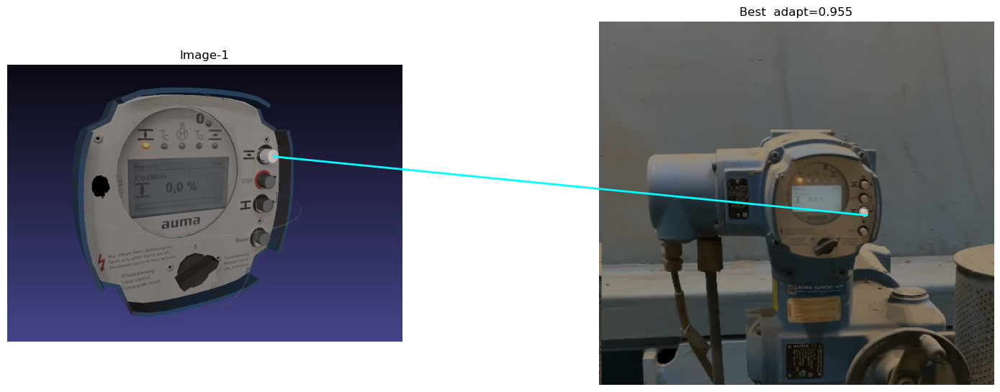

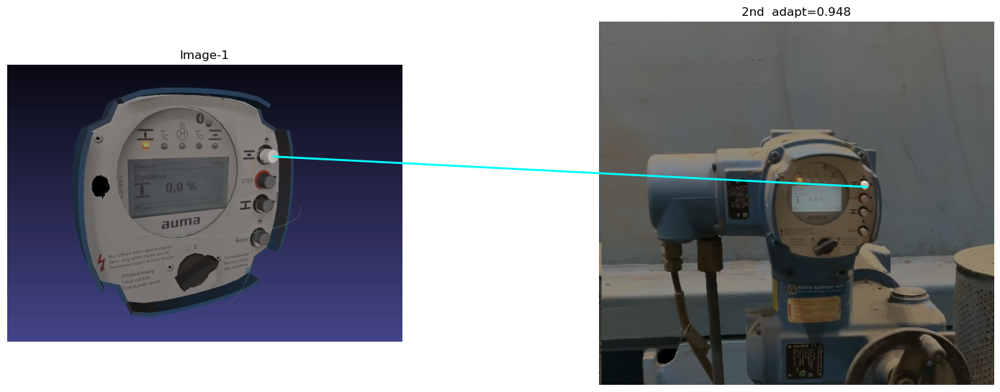

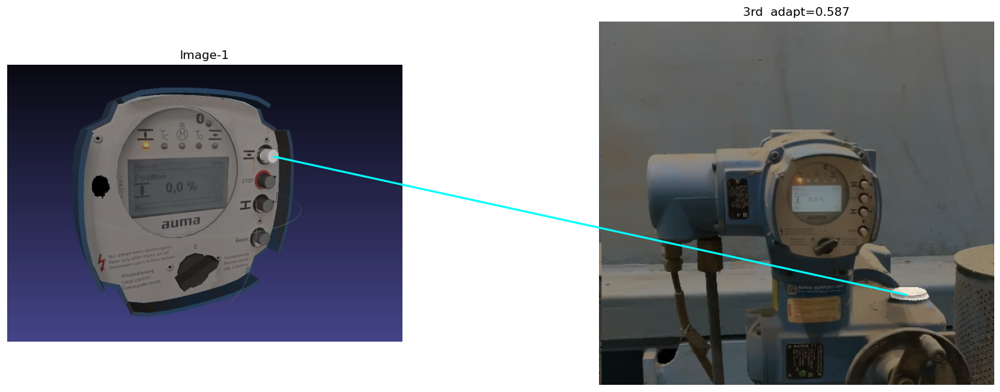

TypeError: only length-1 arrays can be converted to Python scalars

In [41]:
import os, csv, cv2, numpy as np, torch, torch.nn as nn, torch.nn.functional as F
import torch.optim as optim, torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from segment_anything import sam_model_registry, SamPredictor
from PIL import Image

# ─── Your frozen Dinov2Matcher is assumed to be already imported ───────────
IMG1_PATH = r"C:\Users\rebel\Desktop\Image 1.jpg"
IMG2_PATH = r"C:\Users\rebel\Desktop\Image 2.jpg"
LOG_CSV   = "correction.csv"
DEVICE    = "cuda" if torch.cuda.is_available() else "cpu"

dm = Dinov2Matcher("facebookresearch/dinov2", "dinov2_vitl14",
                   smaller_edge_size=896, half_precision=True, device=DEVICE)

class Adapter(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(nn.Linear(dim, dim//2), nn.ReLU(),
                                 nn.Linear(dim//2, dim))
    def forward(self, x): return F.normalize(self.net(x), dim=-1)

feat_dim = dm.extract_features(dm.prepare_image(np.zeros((8,8,3),np.uint8))[0]).shape[1]
adapter  = Adapter(feat_dim).to(DEVICE)
if os.path.isfile("adapters.pth"):
    adapter.load_state_dict(torch.load("adapters.pth", map_location=DEVICE)); adapter.eval()

sam = sam_model_registry["vit_b"](checkpoint="sam_vit_b_01ec64.pth").to(DEVICE)
predictor1, predictor2 = SamPredictor(sam), SamPredictor(sam)

img1 = cv2.cvtColor(cv2.imread(IMG1_PATH), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(IMG2_PATH), cv2.COLOR_BGR2RGB)
clicks = {"pos":None,"neg":None}
def _mouse(e,x,y,f,p):
    if e==cv2.EVENT_LBUTTONDOWN and clicks["pos"] is None: clicks["pos"]=(x,y)
    if e==cv2.EVENT_RBUTTONDOWN and clicks["neg"] is None: clicks["neg"]=(x,y)
    if all(clicks.values()): cv2.destroyAllWindows()
cv2.namedWindow("Click POS/NEG"); cv2.imshow("Click POS/NEG", img1[:,:,::-1])
cv2.setMouseCallback("Click POS/NEG", _mouse); cv2.waitKey(0)
pos1, neg1 = clicks["pos"], clicks["neg"]

t1,g1,s1 = dm.prepare_image(img1); t2,g2,s2 = dm.prepare_image(img2)
with torch.no_grad():
    f1_raw = torch.from_numpy(dm.extract_features(t1)).to(DEVICE).float()
    f2_raw = torch.from_numpy(dm.extract_features(t2)).to(DEVICE).float()
    f1, f2 = adapter(f1_raw), adapter(f2_raw)
f1n, f2n = F.normalize(f1,dim=1), F.normalize(f2,dim=1)

def topk(q,k): return (f2n @ q).cpu().topk(k).indices.tolist()

centers1 = np.array([dm.idx_to_source_position(i,g1,s1) for i in range(f1n.size(0))])
src_pos = int(np.argmin(np.linalg.norm(centers1-[pos1[1],pos1[0]],axis=1)))

# candidate list (top-10)  → keep 3 spatially distinct
DIST=50
raw10   = topk(f1n[src_pos], 10)
cand_idx, cand_pts = [], []
for idx in raw10:
    y,x = dm.idx_to_source_position(idx,g2,s2); pt=np.array([int(x),int(y)])
    if any(np.linalg.norm(pt-c)<DIST for c in cand_pts): continue
    cand_idx.append(idx); cand_pts.append(pt)
    if len(cand_idx)==3: break
if len(cand_idx)<3:
    cand_idx += [i for i in raw10 if i not in cand_idx][:3-len(cand_idx)]

# ── CHANGE #1: compute both sims then sort by adapter sim ──────────────────
triples=[]
for idx in cand_idx:
    s_adapt = (f1n[src_pos]*f2n[idx]).sum().item()
    s_raw   = (F.normalize(f1_raw[src_pos:src_pos+1],dim=1)*
               F.normalize(f2_raw[idx:idx+1],       dim=1)).sum().item()
    triples.append((idx,s_adapt,s_raw))
triples.sort(key=lambda t:t[1], reverse=True)          # best → worst

pos2_idxs   = [t[0] for t in triples]
adapter_s   = [t[1] for t in triples]
raw_s       = [t[2] for t in triples]

print("\nAdapter-sorted similarities (adapter | raw):")
for i,(idx,sa,sr) in enumerate(zip(pos2_idxs,adapter_s,raw_s),1):
    print(f"  {i}. idx {idx}  {sa:.4f} | {sr:.4f}")

# ── CHANGE #2: keep the same order for visualisation ───────────────────────
titles = ["Best","2nd","3rd"]
pos2_list=[]
for idx in pos2_idxs:
    coarse = dm.idx_to_source_position(idx, g2, s2)[::-1]
    pos2_list.append(coarse)  # no refine; add your refine() if you like

for i, (idx, pt) in enumerate(zip(pos2_idxs, pos2_list)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # ── Image-1 mask (POS / NEG clicks) ──────────────────────────────
    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1)
    ax1.imshow(m1[s1.argmax()], alpha=0.4, cmap="gray")
    ax1.axis("off")
    ax1.set_title("Image-1")

    # ── Image-2 mask (candidate match) ───────────────────────────────
    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]),
        point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2)
    ax2.imshow(m2[s2.argmax()], alpha=0.4, cmap="gray")
    ax2.axis("off")
    ax2.set_title(f"{titles[i]}  adapt={adapter_s[i]:.3f}")

    # ── draw connecting line ─────────────────────────────────────────
    ax2.add_artist(ConnectionPatch(
        xyA=pt,  xyB=pos1,
        coordsA="data", coordsB="data",
        axesA=ax2, axesB=ax1,
        color="cyan", lw=2
    ))

    plt.tight_layout()
    plt.show()

def refine(src_pt, init_pt, patch=128, rad=64):
    x1, y1 = map(int, src_pt)
    h1, w1, _ = img1.shape
    half = patch // 2
    x1 = np.clip(x1, half, w1-half)
    y1 = np.clip(y1, half, h1-half)
    tmpl = img1[y1-half:y1+half, x1-half:x1+half]
    x2, y2 = map(int, init_pt)
    h2, w2, _ = img2.shape
    x0 = max(0, x2-rad); y0 = max(0, y2-rad)
    x1b = min(w2, x2+rad); y1b = min(h2, y2+rad)
    win = img2[y0:y1b, x0:x1b]
    _, _, _, loc = cv2.minMaxLoc(cv2.matchTemplate(win, tmpl, cv2.TM_CCOEFF_NORMED))
    return (x0 + loc[0] + half, y0 + loc[1] + half)

pos2_list = [refine(pos1, dm.idx_to_source_position(i, g2, s2)[::-1])
             for i in pos2_idxs]

titles = ["1st Best", "2nd Best", "3rd Best"]
for i, pt in enumerate(pos2_list):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    predictor1.set_image(img1)
    m1, s1, _ = predictor1.predict(
        point_coords=np.array([pos1, neg1]), point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax1.imshow(img1); ax1.imshow(m1[np.argmax(s1)], alpha=0.4, cmap="gray")
    ax1.axis("off"); ax1.set_title("Image 1")
    predictor2.set_image(img2)
    m2, s2, _ = predictor2.predict(
        point_coords=np.array([pt, neg1]), point_labels=np.array([1, 0]),
        multimask_output=True
    )
    ax2.imshow(img2); ax2.imshow(m2[np.argmax(s2)], alpha=0.4, cmap="gray")
    ax2.axis("off"); ax2.set_title(f"Image 2 – {titles[i]}")
    con = ConnectionPatch(xyA=pt, xyB=pos1,
                          coordsA="data", coordsB="data",
                          axesA=ax2, axesB=ax1,
                          color="cyan", linewidth=2)
    ax2.add_artist(con)
    plt.tight_layout(); plt.show()

# ─── 11) Prompt & log corrections ──────────────────────────────────────────
sel = input("Which options are CORRECT? (e.g. 1,3 or 'all'): ").strip().lower()
chosen = [0,1,2] if sel == "all" else [int(x)-1 for x in sel.split(",") if x.isdigit()]

if not os.path.isfile(LOG_CSV):
    with open(LOG_CSV, "w", newline="") as f:
        csv.writer(f).writerow(["img1","x1","y1","img2","x2","y2"])

for i in chosen:
    x2, y2 = pos2_list[i]
    with open(LOG_CSV, "a", newline="") as f:
        csv.writer(f).writerow([IMG1_PATH, pos1[0], pos1[1],
                                IMG2_PATH, x2, y2])
print(f"Logged {len(chosen)} corrections ➜ {LOG_CSV}")

# ─── 12) Dataset class that uses the adapter ───────────────────────────────
class CorrectionDataset(Dataset):
    def __init__(self, csv_path, matcher, adapter_mod):
        self.rows = list(csv.reader(open(csv_path)))[1:]  # skip header
        self.dm = matcher
        self.adapter = adapter_mod
    def __len__(self):
        return len(self.rows)
    def __getitem__(self, idx):
        img1_p,x1,y1,img2_p,x2,y2 = self.rows[idx]
        x1,y1,x2,y2 = map(int, (x1,y1,x2,y2))
        I1 = cv2.cvtColor(cv2.imread(img1_p), cv2.COLOR_BGR2RGB)
        I2 = cv2.cvtColor(cv2.imread(img2_p), cv2.COLOR_BGR2RGB)
        with torch.no_grad():
            t1,g1,s1 = self.dm.prepare_image(I1)
            t2,g2,s2 = self.dm.prepare_image(I2)
            F1 = self.adapter(torch.from_numpy(self.dm.extract_features(t1)).to(DEVICE)).cpu().numpy()
            F2 = self.adapter(torch.from_numpy(self.dm.extract_features(t2)).to(DEVICE)).cpu().numpy()
        c1 = np.array([self.dm.idx_to_source_position(i,g1,s1) for i in range(F1.shape[0])])
        c2 = np.array([self.dm.idx_to_source_position(i,g2,s2) for i in range(F2.shape[0])])
        ia = int(np.argmin(np.linalg.norm(c1 - [y1,x1], axis=1)))
        ip = int(np.argmin(np.linalg.norm(c2 - [y2,x2], axis=1)))
        anc = torch.from_numpy(F1[ia]).float()
        pos = torch.from_numpy(F2[ip]).float()
        neg_pool = np.delete(np.arange(F2.shape[0]), ip)
        neg_idx  = np.random.choice(neg_pool, 5, replace=False)
        negs = torch.from_numpy(F2[neg_idx]).float()
        return anc, pos, negs

# ─── 13) Fine-tune adapter when enough corrections are logged ──────────────
def finetune_adapter(csv_path=LOG_CSV, epochs=5):
    ds = CorrectionDataset(csv_path, dm, adapter)
    dl = DataLoader(ds, batch_size=8, shuffle=True)
    opt = optim.Adam(adapter.parameters(), lr=1e-4)
    loss_fn = nn.MarginRankingLoss(margin=0.5)

    for ep in range(1, epochs+1):
        total = 0.0
        for anc, pos, negs in dl:
            anc, pos, negs = anc.to(DEVICE), pos.to(DEVICE), negs.to(DEVICE)
            ae, pe = adapter(anc), adapter(pos)
            s_pos = (ae * pe).sum(1)
            B,K,D = negs.shape
            ne = adapter(negs.view(-1,D)).view(B,K,D)
            s_neg,_ = (ae.unsqueeze(1)*ne).sum(2).max(1)
            loss = loss_fn(s_pos, s_neg, torch.ones_like(s_pos))
            opt.zero_grad(); loss.backward(); opt.step()
            total += loss.item()
        print(f"Epoch {ep}/{epochs} – Avg Loss {total/len(dl):.4f}")

    torch.save(adapter.state_dict(), "adapters.pth")
    print("✅ adapter updated & saved")

# retrain if ≥ 50 logged pairs
if (sum(1 for _ in open(LOG_CSV)) - 1) >= 50:
    print("≥50 corrections logged → fine-tuning adapter …")
    finetune_adapter()

# the rest of your logging + adapter-training code remains unchanged
